Problem 2:

The dataset Education - Post 12th Standard.csv contains information on various colleges. You are expected to do a Principal Component Analysis for this case study according to the instructions given. The data dictionary of the 'Education - Post 12th Standard.csv' can be found in the following file: Data Dictionary.xlsx.

Perform Exploratory Data Analysis [both univariate and multivariate analysis to be performed]. What insight do you draw from the EDA?
Is scaling necessary for PCA in this case? Give justification and perform scaling.
Comment on the comparison between the covariance and the correlation matrices from this data [on scaled data].
Check the dataset for outliers before and after scaling. What insight do you derive here? [Please do not treat Outliers unless specifically asked to do so]
Extract the eigenvalues and eigenvectors.[print both]
Perform PCA and export the data of the Principal Component (eigenvectors) into a data frame with the original features
Write down the explicit form of the first PC (in terms of the eigenvectors. Use values with two places of decimals only). [hint: write the linear equation of PC in terms of eigenvectors and corresponding features]
Consider the cumulative values of the eigenvalues. How does it help you to decide on the optimum number of principal components? What do the eigenvectors indicate?
Explain the business implication of using the Principal Component Analysis for this case study. How may PCs help in the further analysis? [Hint: Write Interpretations of the Principal Components Obtained]

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stats


Perform Exploratory Data Analysis [both univariate and multivariate analysis to be performed]. What insight do you draw from the EDA? 

view and read data

In [2]:
data_df = pd.read_csv("Education+-+Post+12th+Standard.csv")
data_df.head()

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [3]:
data_df.tail()

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
772,Worcester State College,2197,1515,543,4,26,3089,2029,6797,3900,500,1200,60,60,21.0,14,4469,40
773,Xavier University,1959,1805,695,24,47,2849,1107,11520,4960,600,1250,73,75,13.3,31,9189,83
774,Xavier University of Louisiana,2097,1915,695,34,61,2793,166,6900,4200,617,781,67,75,14.4,20,8323,49
775,Yale University,10705,2453,1317,95,99,5217,83,19840,6510,630,2115,96,96,5.8,49,40386,99
776,York College of Pennsylvania,2989,1855,691,28,63,2988,1726,4990,3560,500,1250,75,75,18.1,28,4509,99


In [4]:
data_df.shape

(777, 18)

In [5]:
print("The number of rows are: ",data_df.shape[0],"\nThe number of columns are: ",data_df.shape[1])

The number of rows are:  777 
The number of columns are:  18


In [6]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Names        777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

all the attributes are integer excpet for sf ratio which is floadt and the only categorical attribute is Names.
There are no missing values as shown above.

In [7]:
data_df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [8]:
Need to calculate the median

SyntaxError: invalid syntax (<ipython-input-8-dbc3ab1f6556>, line 1)

In [8]:
data_df.describe(include=['object'])

,Names
count,777
unique,777
top,Ohio University
freq,1


top is Chatham college uni with non null values 777 and unique val of 777 occuring 1 time

In [9]:
dups = data_df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

data_df[dups]

Number of duplicate rows = 0


,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate


In [10]:
data_df.isnull().sum()

Names          0
Apps           0
Accept         0
Enroll         0
Top10perc      0
Top25perc      0
F.Undergrad    0
P.Undergrad    0
Outstate       0
Room.Board     0
Books          0
Personal       0
PhD            0
Terminal       0
S.F.Ratio      0
perc.alumni    0
Expend         0
Grad.Rate      0
dtype: int64

create two dummy object namely num and cat

In [12]:
num = []
cat = [] 
for i in data_df.columns:
    if data_df[i].dtypes != 'int64'and data_df[i].dtypes != 'float64':
        cat.append(i)
    else:
        num.append(i)
print(cat)
print(num)

['Names']
['Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc', 'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books', 'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend', 'Grad.Rate']


UNIVARIANT ANALYSIS.Looking for any outliers and checking the histogram to measure the skewness of columns. 

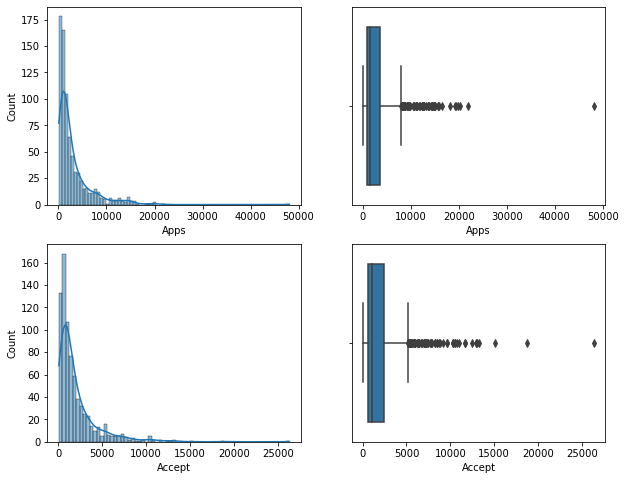

In [11]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Apps'], kde=True, ax=axes[0][0])
sns.boxplot(x='Apps', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Accept'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Accept', data=data_df , ax=axes[1][1])
plt.show()

In [12]:
stats.skew(data_df.Apps)

3.7165574035202718

Apps field is highly skewed.

In [13]:
stats.skew(data_df.Accept)

3.4111258724395235

Accept field is highly skewed.

From the above descriptive statistics and plots, we see that the Apps and Accept field is right skewed and has outliers

Hence, if we have to impute values, median will be the right statistics to impute

Let us check how many values are missing

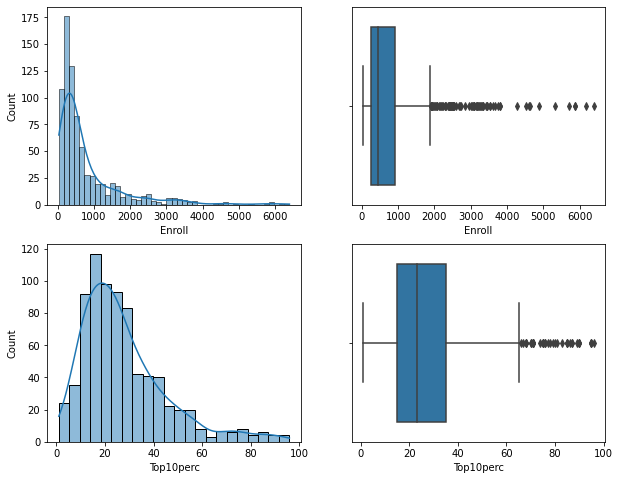

In [16]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Enroll'], kde=True, ax=axes[0][0])
sns.boxplot(x='Enroll', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Top10perc'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Top10perc', data=data_df , ax=axes[1][1])
plt.show()

In [17]:
stats.skew(data_df.Enroll)

2.6852679191653412

Enroll field is highly skewed.

In [18]:
stats.skew(data_df.Top10perc)

1.410487098842332

Top10perc field is highly skewed.

From the above descriptive statistics and plots, we see that the Enroll and Top10perc field is right skewed and has outliers

Hence, if we have to impute values, median will be the right statistics to impute

Let us check how many values are missing

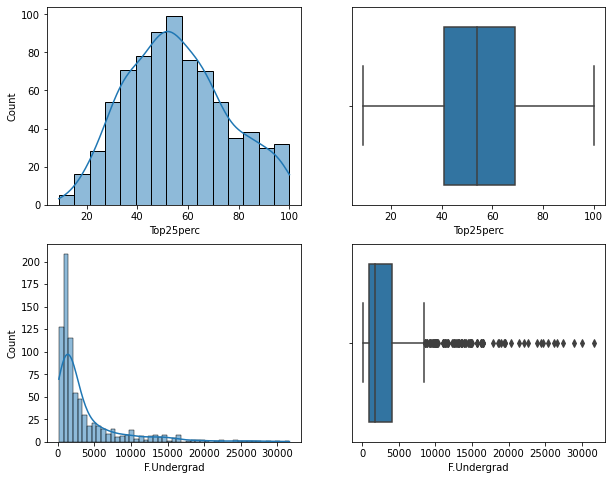

In [19]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Top25perc'], kde=True, ax=axes[0][0])
sns.boxplot(x='Top25perc', data=data_df, ax=axes[0][1])
sns.histplot(data_df['F.Undergrad'] , kde=True, ax=axes[1][0])
sns.boxplot(x='F.Undergrad', data=data_df , ax=axes[1][1])
plt.show()

In [20]:
stats.skew(data_df.Top25perc)

0.2588394269741162

Top25perc field is approxiamtely symmetric.

In [21]:
stats.skew(data_df['F.Undergrad'])

2.6054157486361564

F.Undergrad field is highly skewed.

From the above descriptive statistics and plots, we see that the F.Undergrad field is right skewed and has outliers.

Hence, if we have to impute values, median will be the right statistics to impute. Top25perc is Normal.

Let us check how many values are missing

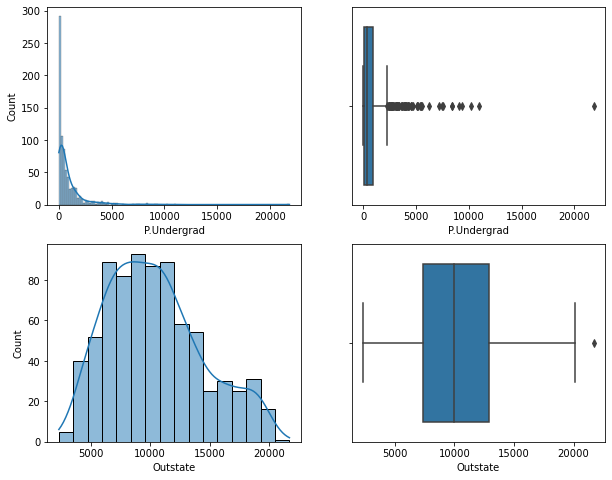

In [22]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['P.Undergrad'], kde=True, ax=axes[0][0])
sns.boxplot(x='P.Undergrad', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Outstate'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Outstate', data=data_df , ax=axes[1][1])
plt.show()

In [23]:
stats.skew(data_df['P.Undergrad'])

5.681358169711681

P.Undergrad field is Highly skewed

In [24]:
stats.skew(data_df.Outstate)

0.508294284359404

Outstate is moderately skewed

From the above descriptive statistics and plots, we see that the P.Undergrad field is right skewed and has outliers.

Hence, if we have to impute values, median will be the right statistics to impute. Outstate has outliers and is moderately skewed

Let us check how many values are missing

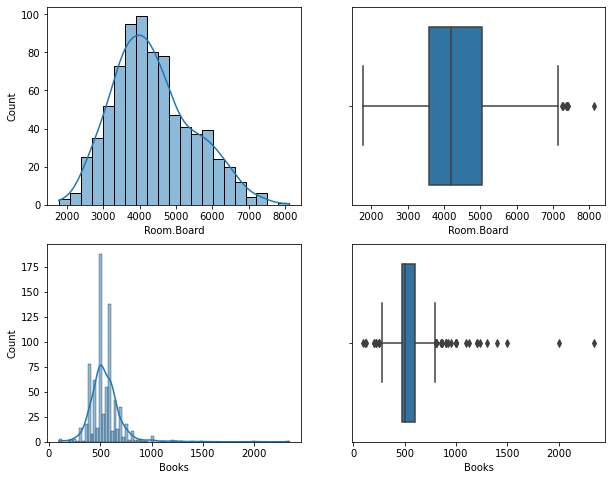

In [25]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Room.Board'], kde=True, ax=axes[0][0])
sns.boxplot(x='Room.Board', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Books'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Books', data=data_df , ax=axes[1][1])
plt.show()

In [26]:
stats.skew(data_df['Room.Board'])

0.4764335489968277

Room board field is approxiamtely symmetric with outleirs

In [27]:
stats.skew(data_df['Books'])

3.478293278376379

Books field is highly skewed.

From the above descriptive statistics and plots, we see that the Room board and Books field is right skewed and has outliers.

Hence, if we have to impute values, median will be the right statistics to impute. Outstate has outliers.

Let us check how many values are missing

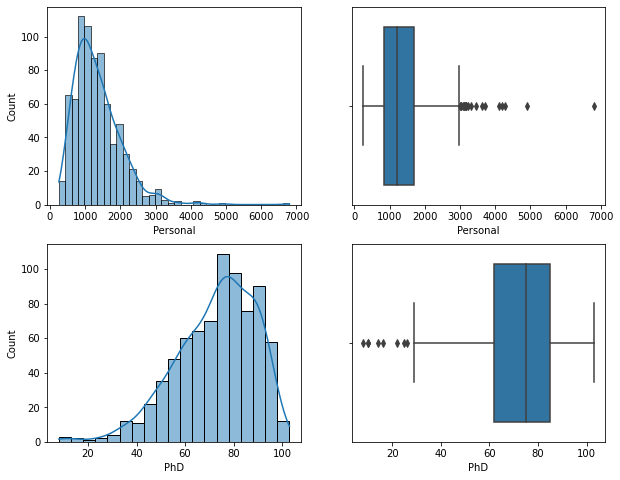

In [28]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Personal'], kde=True, ax=axes[0][0])
sns.boxplot(x='Personal', data=data_df, ax=axes[0][1])
sns.histplot(data_df['PhD'] , kde=True, ax=axes[1][0])
sns.boxplot(x='PhD', data=data_df , ax=axes[1][1])
plt.show()

In [29]:
stats.skew(data_df['Personal'])

1.7391308384291781

Personal field is highly skewed.

In [30]:
stats.skew(data_df['PhD'])

-0.7666863621506335

Phd field is highly skewed.

From the above descriptive statistics and plots, we see that the Personal field is rigth skewed and PhD field is left skewed and has outliers.

Hence, if we have to impute values, median will be the right statistics to impute. Outstate has outliers.

Let us check how many values are missingm

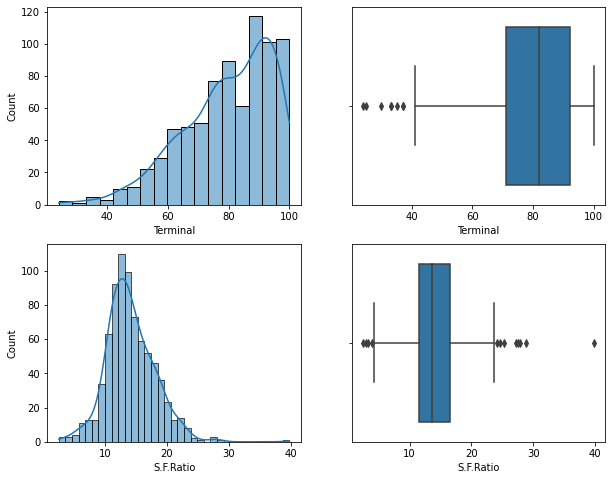

In [31]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Terminal'], kde=True, ax=axes[0][0])
sns.boxplot(x='Terminal', data=data_df, ax=axes[0][1])
sns.histplot(data_df['S.F.Ratio'] , kde=True, ax=axes[1][0])
sns.boxplot(x='S.F.Ratio', data=data_df , ax=axes[1][1])
plt.show()

In [32]:
stats.skew(data_df['Terminal'])

-0.8149651536781263

Terminal field is highly skewed.

In [33]:
stats.skew(data_df['S.F.Ratio'])

0.6661461873546756

S.F Ratio field is moderately skewed.

From the above descriptive statistics and plots, we see that the Terminal field is left skewed and S.F Ratio field is left and right skewed and has outliers.

Hence, if we have to impute values, median will be the right statistics to impute. Outstate has outliers.

Let us check how many values are missingm

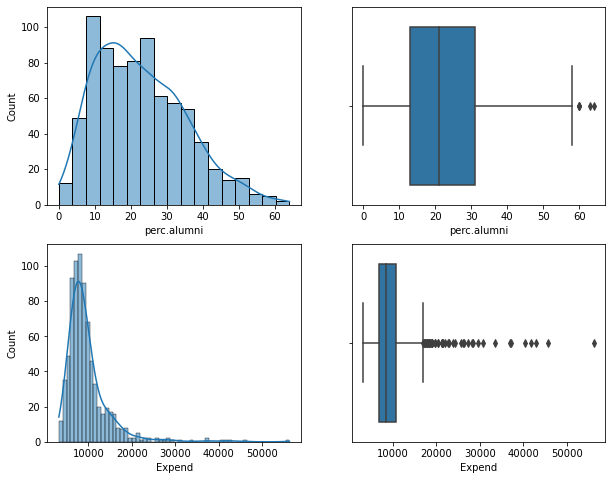

In [34]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['perc.alumni'], kde=True, ax=axes[0][0])
sns.boxplot(x='perc.alumni', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Expend'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Expend', data=data_df , ax=axes[1][1])
plt.show()

In [35]:
stats.skew(data_df['perc.alumni'])

0.6057189848601131

perc.alumni field is moderately skewed.

In [36]:
stats.skew(data_df['Expend'])

3.4526399033472197

Expend field is highly skewed.

From the above descriptive statistics and plots, we see that the perc.alumni field is right skewed and Expend field is right skewed and has outliers.

Hence, if we have to impute values, median will be the right statistics to impute. Outstate has outliers.

Let us check how many values are missingm

<AxesSubplot:xlabel='Grad.Rate'>

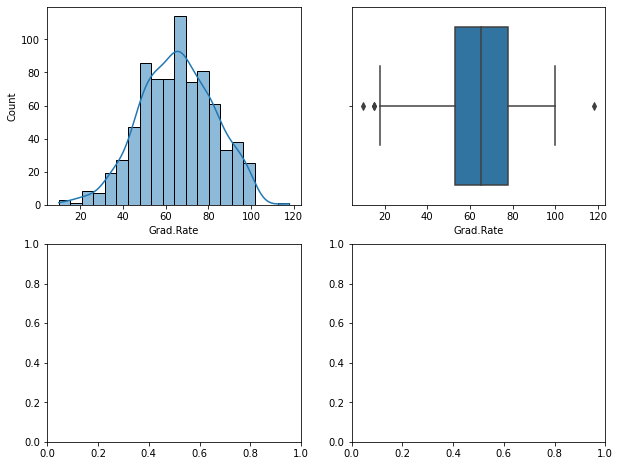

In [37]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Grad.Rate'], kde=True, ax=axes[0][0])
sns.boxplot(x='Grad.Rate', data=data_df, ax=axes[0][1])

In [38]:
stats.skew(data_df['Grad.Rate'])

-0.11355752571272018

In [39]:
grad rate field is close to normal but has outliers.

SyntaxError: invalid syntax (<ipython-input-39-fe8d0608ac6b>, line 1)

In [40]:
Checking the detailsof the categorical attributes which is names here.

SyntaxError: invalid syntax (<ipython-input-40-8ab0fbfb066a>, line 1)

In [41]:
data_df.describe(include=['object'])

,Names
count,777
unique,777
top,Skidmore College
freq,1


In [42]:
from statistics import mode
mode(data_df['Names'])

'Abilene Christian University'

In [43]:
data_df['Names'].value_counts

<bound method IndexOpsMixin.value_counts of 0        Abilene Christian University
1                  Adelphi University
2                      Adrian College
3                 Agnes Scott College
4           Alaska Pacific University
                    ...              
772           Worcester State College
773                 Xavier University
774    Xavier University of Louisiana
775                   Yale University
776      York College of Pennsylvania
Name: Names, Length: 777, dtype: object>

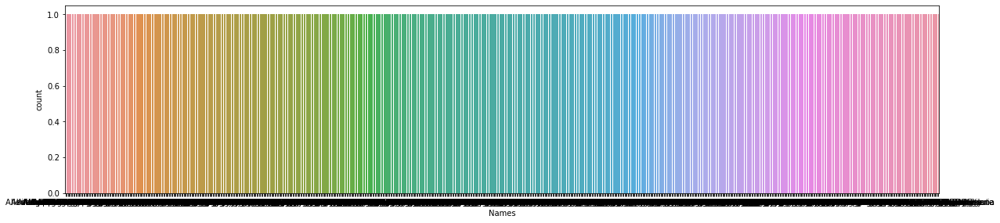

In [44]:
plt.subplots(figsize=(20,15))
#plt.figure(figsize = (15,10))
plt.subplot(3,1,1)
sns.countplot(x=data_df['Names'])

import warnings
warnings.filterwarnings('ignore')

In [45]:
def univariateAnalysis_category(cat_column):
    print("Details of " + cat_column)
    print("----------------------------------------------------------------")
    print(data_df_cat[cat_column].value_counts())
    plt.figure()
    plt.subplots(figsize=(20,5))
    data_df_cat[cat_column].value_counts().plot.bar(title="Frequency Distribution of " + cat_column)
    plt.show()
    print("       ")

In [46]:
data_df_cat = data_df.select_dtypes(include = ['object'])
lstcatcolumns = list(data_df_cat.columns.values)
lstcatcolumns

['Names']

Details of Names
----------------------------------------------------------------
Skidmore College                        1
Clark University                        1
Oglethorpe University                   1
St. Mary's University of San Antonio    1
Marshall University                     1
                                       ..
Brewton-Parker College                  1
Dillard University                      1
Texas Lutheran College                  1
Creighton University                    1
Missouri Southern State College         1
Name: Names, Length: 777, dtype: int64


<Figure size 432x288 with 0 Axes>

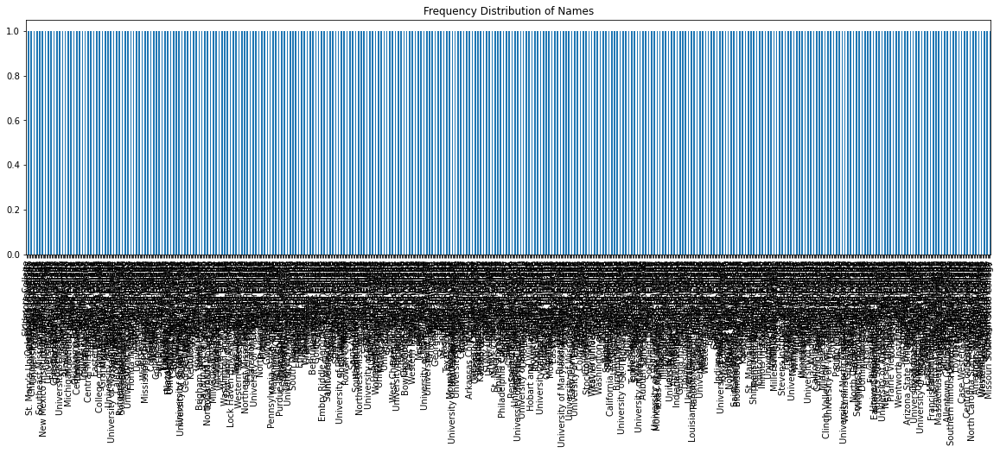

In [47]:
for x in lstcatcolumns:
    univariateAnalysis_category(x)

In [49]:
data_df['Names'].value_counts(normalize=True)

Skidmore College                        0.001287
Clark University                        0.001287
Oglethorpe University                   0.001287
St. Mary's University of San Antonio    0.001287
Marshall University                     0.001287
                                          ...   
Brewton-Parker College                  0.001287
Dillard University                      0.001287
Texas Lutheran College                  0.001287
Creighton University                    0.001287
Missouri Southern State College         0.001287
Name: Names, Length: 777, dtype: float64

In [50]:
data_df.Names.value_counts()

Skidmore College                        1
Clark University                        1
Oglethorpe University                   1
St. Mary's University of San Antonio    1
Marshall University                     1
                                       ..
Brewton-Parker College                  1
Dillard University                      1
Texas Lutheran College                  1
Creighton University                    1
Missouri Southern State College         1
Name: Names, Length: 777, dtype: int64

BIVARIANT ANALYSIS

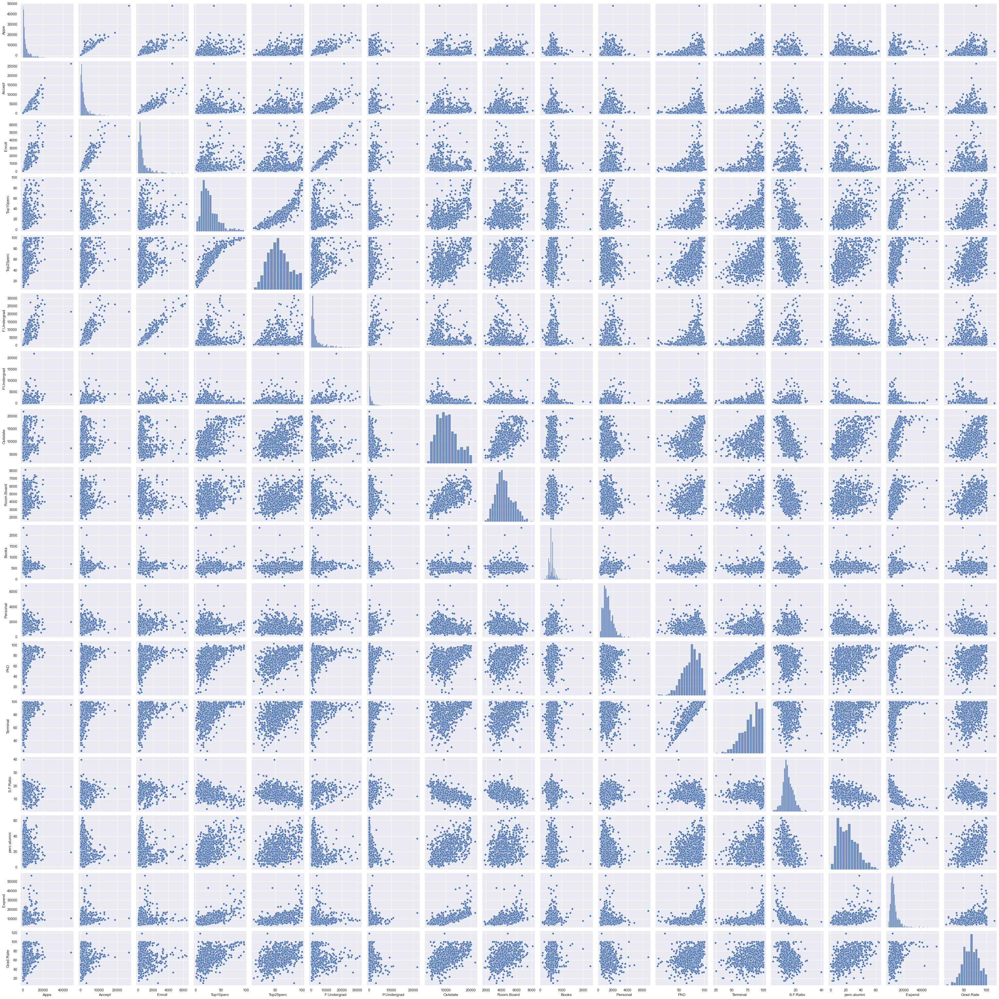

In [51]:
sns.set()
sns.pairplot(data_df)
plt.show()

In [ ]:
1)the main diagonal plot is histogram for each of the attributes.(univariant analysis)
2)we can see the various positive correlation 


Check the correlation 

In [52]:
corr = data_df.corr()
corr

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.000000,0.943451,0.846822,0.338834,0.351640,0.814491,0.398264,0.050159,0.164939,0.132559,0.178731,0.390697,0.369491,0.095633,-0.090226,0.259592,0.146755
Accept,0.943451,1.000000,0.911637,0.192447,0.247476,0.874223,0.441271,-0.025755,0.090899,0.113525,0.200989,0.355758,0.337583,0.176229,-0.159990,0.124717,0.067313
Enroll,0.846822,0.911637,1.000000,0.181294,0.226745,0.964640,0.513069,-0.155477,-0.040232,0.112711,0.280929,0.331469,0.308274,0.237271,-0.180794,0.064169,-0.022341
Top10perc,0.338834,0.192447,0.181294,1.000000,0.891995,0.141289,-0.105356,0.562331,0.371480,0.118858,-0.093316,0.531828,0.491135,-0.384875,0.455485,0.660913,0.494989
Top25perc,0.351640,0.247476,0.226745,0.891995,1.000000,0.199445,-0.053577,0.489394,0.331490,0.115527,-0.080810,0.545862,0.524749,-0.294629,0.417864,0.527447,0.477281
F.Undergrad,0.814491,0.874223,0.964640,0.141289,0.199445,1.000000,0.570512,-0.215742,-0.068890,0.115550,0.317200,0.318337,0.300019,0.279703,-0.229462,0.018652,-0.078773
P.Undergrad,0.398264,0.441271,0.513069,-0.105356,-0.053577,0.570512,1.000000,-0.253512,-0.061326,0.081200,0.319882,0.149114,0.141904,0.232531,-0.280792,-0.083568,-0.257001
Outstate,0.050159,-0.025755,-0.155477,0.562331,0.489394,-0.215742,-0.253512,1.000000,0.654256,0.038855,-0.299087,0.382982,0.407983,-0.554821,0.566262,0.672779,0.571290
Room.Board,0.164939,0.090899,-0.040232,0.371480,0.331490,-0.068890,-0.061326,0.654256,1.000000,0.127963,-0.199428,0.329202,0.374540,-0.362628,0.272363,0.501739,0.424942
Books,0.132559,0.113525,0.112711,0.118858,0.115527,0.115550,0.081200,0.038855,0.127963,1.000000,0.179295,0.026906,0.099955,-0.031929,-0.040208,0.112409,0.001061


<AxesSubplot:>

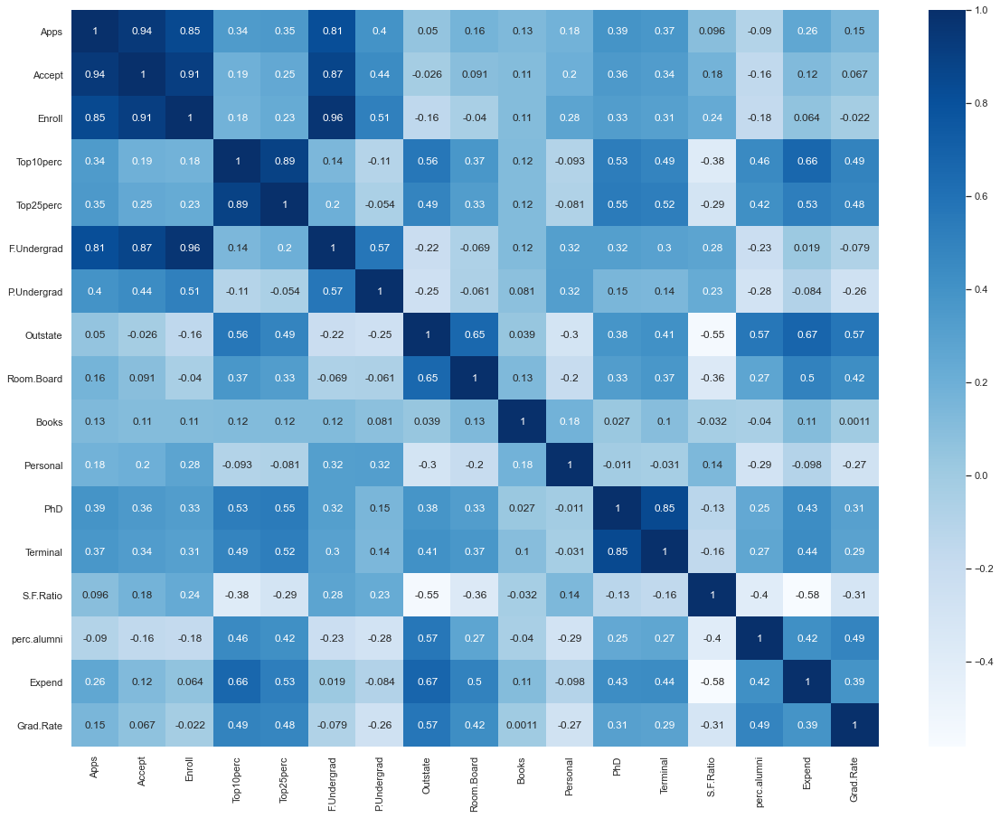

In [53]:
plt.subplots(figsize=(20,15))
sns.heatmap(corr, annot=True, cmap='Blues')

C

Outlier treatment 
outliers are observed in all the attributes except top25perc which has no outliers.



Check the dataset for outliers before and after scaling. What insight do you derive here? [Please do not treat Outliers unless specifically asked to do so]

In [54]:
def remove_outliers(col):
    sorted(col)
    Q1,Q3 = col.quantile([0.25,0.75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5*IQR)
    upper_range = Q3+(1.5*IQR)
    return lower_range, upper_range

In [55]:
out = ['Apps','Accept', 'Enroll','Top10perc','F.Undergrad','P.Undergrad','Outstate','Room.Board','Books','Personal','PhD','Terminal','S.F.Ratio','perc.alumni','Expend','Grad.Rate']

In [ ]:
out = ['Apps','Accept', 'Enroll','Top10perc','F.Undergrad','P.Undergrad','Outstate','Room.Board','Books','Personal','PhD','Terminal','S.F.Ratio','perc.alumni','Expend','Grad.Rate']


for i in out:
    print(i)
    
    
    
 remove_outliers(data_df['Apps'])   



remove_outliers(data_df['Accept'])
    
    
    for i in out:
    lr,ur = remove_outliers(data_df[i])
    data_df[i]=np.where(data_df[i]>ur,ur,data_df[i])
    data_df[i]=np.where(data_df[i]<lr,lr,data_df[i])


In [56]:
for i in out:
    print(i)

Apps
Accept
Enroll
Top10perc
F.Undergrad
P.Undergrad
Outstate
Room.Board
Books
Personal
PhD
Terminal
S.F.Ratio
perc.alumni
Expend
Grad.Rate


In [57]:
remove_outliers(data_df['Apps'])


(-3496.0, 7896.0)

In [58]:
remove_outliers(data_df['Accept'])

(-2126.0, 5154.0)

In [59]:
for i in out:
    lr,ur = remove_outliers(data_df[i])
    data_df[i]=np.where(data_df[i]>ur,ur,data_df[i])
    data_df[i]=np.where(data_df[i]<lr,lr,data_df[i])

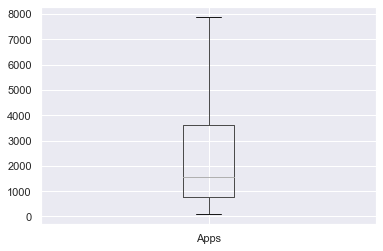

In [60]:
data_df.boxplot(['Apps'])
plt.show()

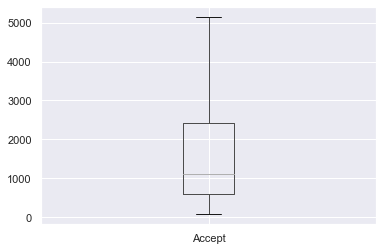

In [61]:
data_df.boxplot(['Accept'])
plt.show()

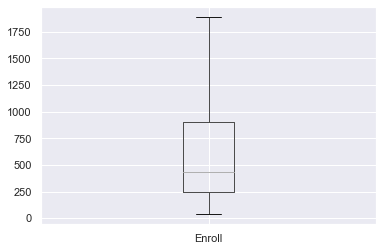

In [62]:
data_df.boxplot(['Enroll'])
plt.show()

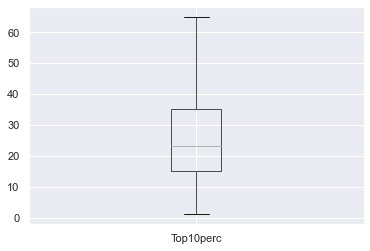

In [63]:
data_df.boxplot(['Top10perc'])
plt.show()

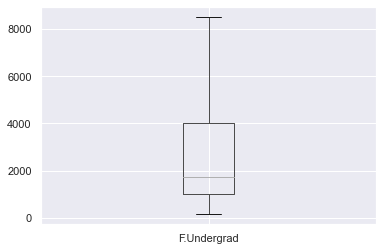

In [64]:
data_df.boxplot(['F.Undergrad'])
plt.show()

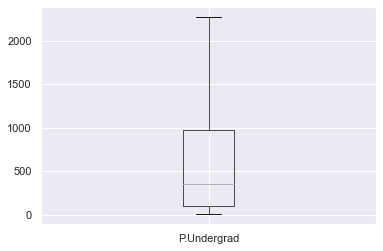

In [65]:
data_df.boxplot(['P.Undergrad'])
plt.show()

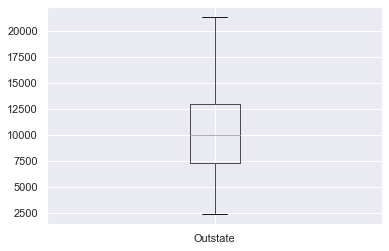

In [66]:
data_df.boxplot(['Outstate'])
plt.show()

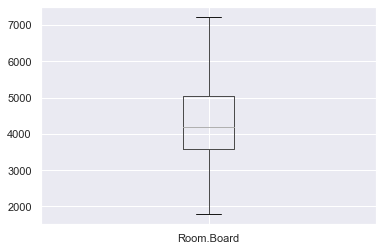

In [67]:
data_df.boxplot(['Room.Board'])
plt.show()

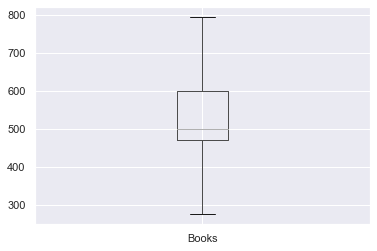

In [68]:
data_df.boxplot(['Books'])
plt.show()

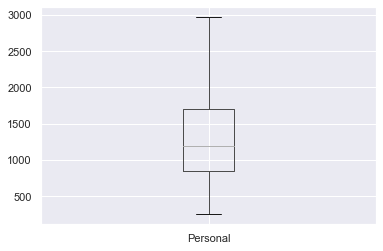

In [69]:
data_df.boxplot(['Personal'])
plt.show()

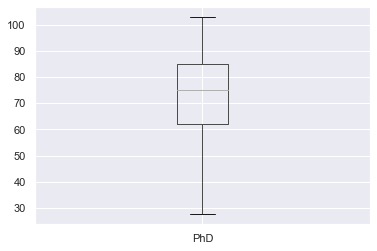

In [70]:
data_df.boxplot(['PhD'])
plt.show()

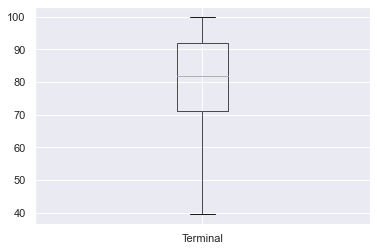

In [71]:
data_df.boxplot(['Terminal'])
plt.show()

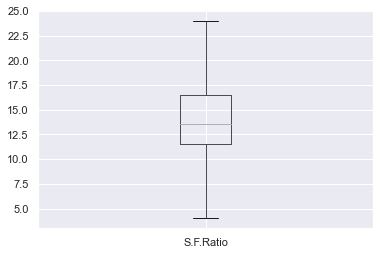

In [72]:
data_df.boxplot(['S.F.Ratio'])
plt.show()

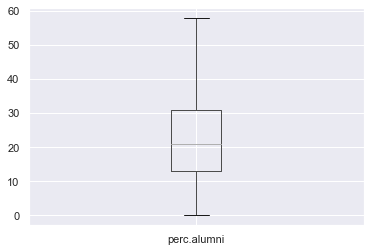

In [73]:
data_df.boxplot(['perc.alumni'])
plt.show()

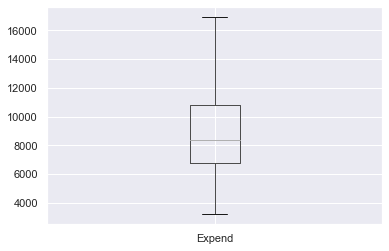

In [74]:
data_df.boxplot(['Expend'])
plt.show()

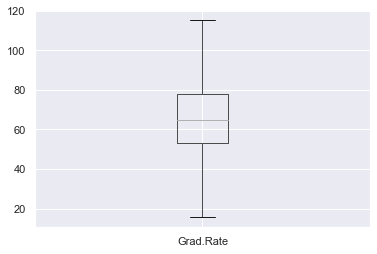

In [75]:
data_df.boxplot(['Grad.Rate'])
plt.show()

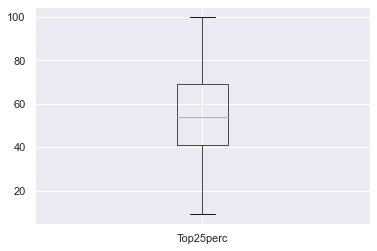

In [76]:
data_df.boxplot(['Top25perc'])
plt.show()

Checking the distribution with the treated outliers below for each attribute

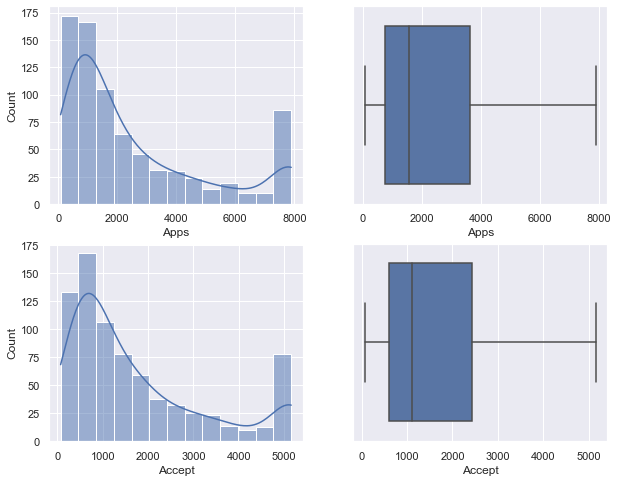

In [77]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Apps'], kde=True, ax=axes[0][0])
sns.boxplot(x='Apps', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Accept'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Accept', data=data_df , ax=axes[1][1])
plt.show()

In [78]:
stats.skew(data_df.Apps)

1.164081007910429

In [79]:
stats.skew(data_df.Accept)

1.148975186617168

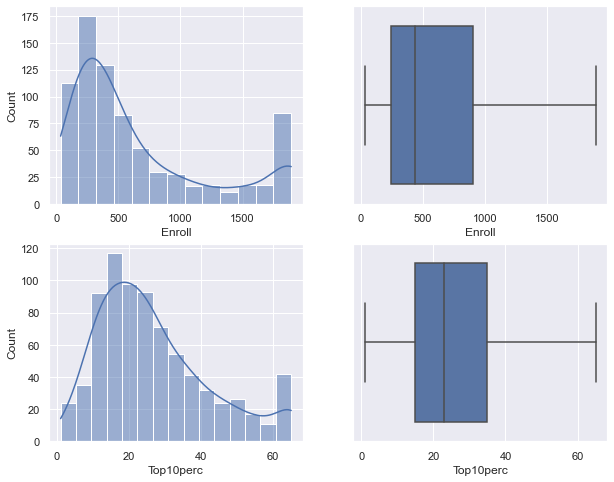

In [80]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Enroll'], kde=True, ax=axes[0][0])
sns.boxplot(x='Enroll', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Top10perc'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Top10perc', data=data_df , ax=axes[1][1])
plt.show()

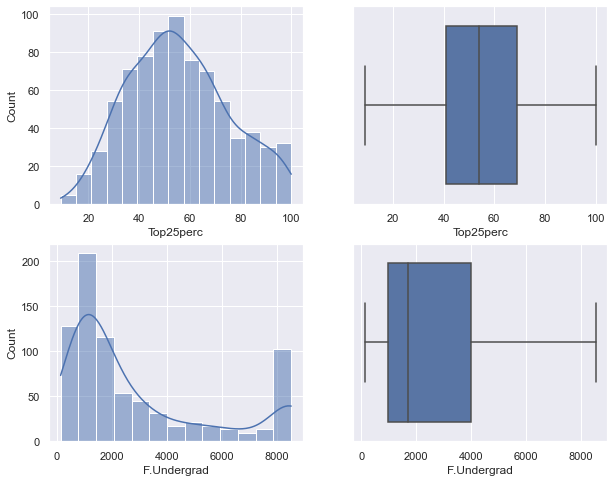

In [81]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Top25perc'], kde=True, ax=axes[0][0])
sns.boxplot(x='Top25perc', data=data_df, ax=axes[0][1])
sns.histplot(data_df['F.Undergrad'] , kde=True, ax=axes[1][0])
sns.boxplot(x='F.Undergrad', data=data_df , ax=axes[1][1])
plt.show()

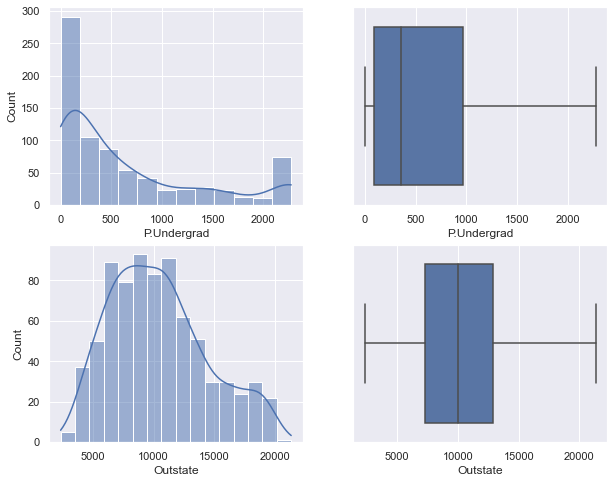

In [82]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['P.Undergrad'], kde=True, ax=axes[0][0])
sns.boxplot(x='P.Undergrad', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Outstate'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Outstate', data=data_df , ax=axes[1][1])
plt.show()

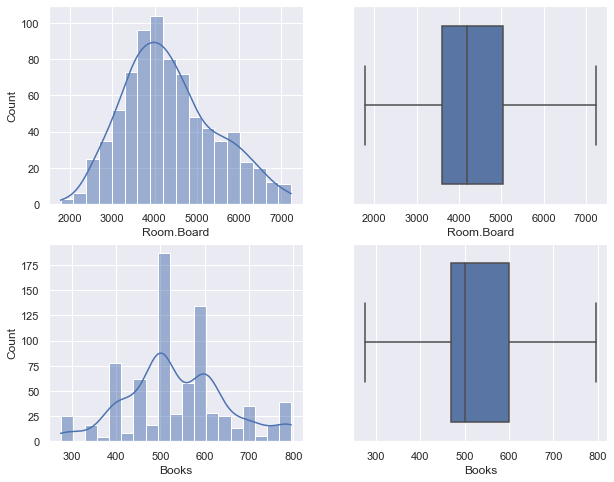

In [83]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Room.Board'], kde=True, ax=axes[0][0])
sns.boxplot(x='Room.Board', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Books'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Books', data=data_df , ax=axes[1][1])
plt.show()

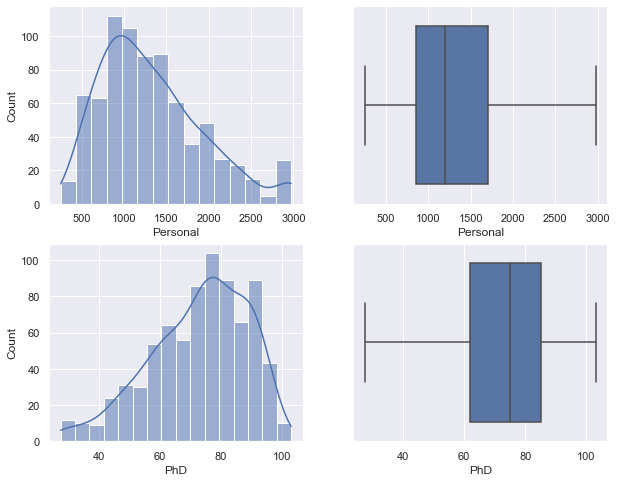

In [84]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Personal'], kde=True, ax=axes[0][0])
sns.boxplot(x='Personal', data=data_df, ax=axes[0][1])
sns.histplot(data_df['PhD'] , kde=True, ax=axes[1][0])
sns.boxplot(x='PhD', data=data_df , ax=axes[1][1])
plt.show()

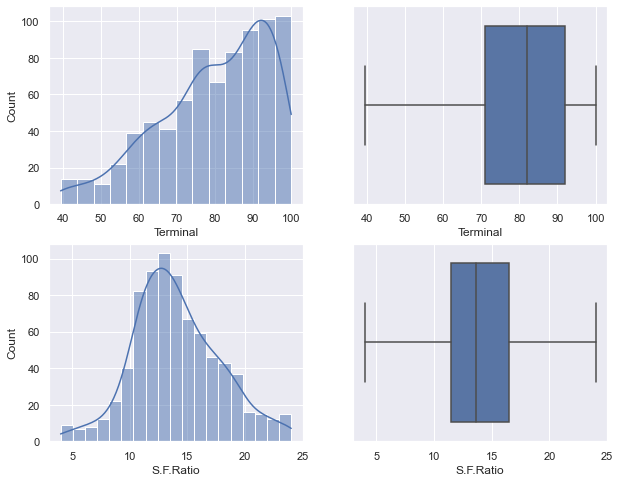

In [85]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Terminal'], kde=True, ax=axes[0][0])
sns.boxplot(x='Terminal', data=data_df, ax=axes[0][1])
sns.histplot(data_df['S.F.Ratio'] , kde=True, ax=axes[1][0])
sns.boxplot(x='S.F.Ratio', data=data_df , ax=axes[1][1])
plt.show()

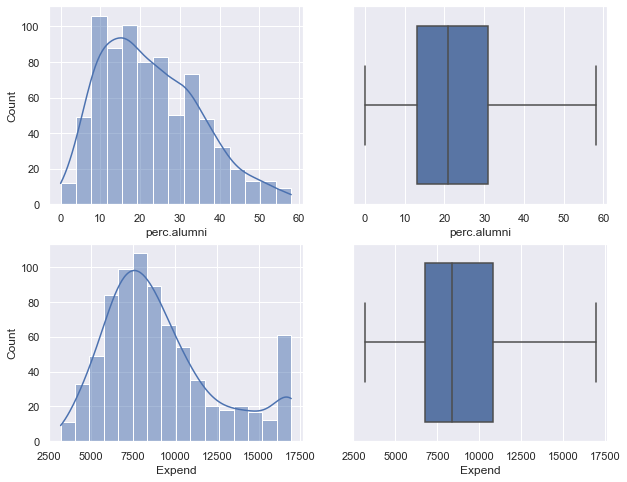

In [86]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['perc.alumni'], kde=True, ax=axes[0][0])
sns.boxplot(x='perc.alumni', data=data_df, ax=axes[0][1])
sns.histplot(data_df['Expend'] , kde=True, ax=axes[1][0])
sns.boxplot(x='Expend', data=data_df , ax=axes[1][1])
plt.show()

In [87]:
stats.skew(data_df['perc.alumni'])

0.5716534954184954

In [88]:
stats.skew(data_df['Expend'])

0.8738438705808742

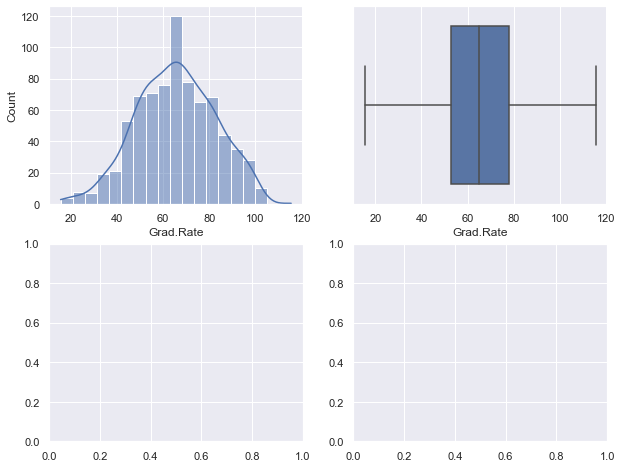

In [89]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(10,8)
sns.histplot(data_df['Grad.Rate'], kde=True, ax=axes[0][0])
sns.boxplot(x='Grad.Rate', data=data_df, ax=axes[0][1])
plt.show()

In [ ]:
stats.skew(data_df['Grad.Rate'])

SCALING USING ZSCORE

Is scaling necessary for PCA in this case? Give justification and perform scaling.

In [14]:
cat=[]
num=[]
for i in data_df.columns:
    if data_df[i].dtype=="object":
        cat.append(i)
    else:
        num.append(i)
print(cat) 
print(num)

['Names']
['Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc', 'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books', 'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend', 'Grad.Rate']


In [15]:
## Using Zscore for scaling/standardisation
from scipy.stats import zscore
data_scaled=data_df[num].apply(zscore)

In [16]:
data_scaled.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,-0.346882,-0.321205,-0.063509,-0.258583,-0.191827,-0.168116,-0.209207,-0.746356,-0.964905,-0.602312,1.270045,-0.163028,-0.115729,1.013776,-0.867574,-0.501910,-0.318252
1,-0.210884,-0.038703,-0.288584,-0.655656,-1.353911,-0.209788,0.244307,0.457496,1.909208,1.215880,0.235515,-2.675646,-3.378176,-0.477704,-0.544572,0.166110,-0.551262
2,-0.406866,-0.376318,-0.478121,-0.315307,-0.292878,-0.549565,-0.497090,0.201305,-0.554317,-0.905344,-0.259582,-1.204845,-0.931341,-0.300749,0.585935,-0.177290,-0.667767
3,-0.668261,-0.681682,-0.692427,1.840231,1.677612,-0.658079,-0.520752,0.626633,0.996791,-0.602312,-0.688173,1.185206,1.175657,-1.615274,1.151188,1.792851,-0.376504
4,-0.726176,-0.764555,-0.780735,-0.655656,-0.596031,-0.711924,0.009005,-0.716508,-0.216723,1.518912,0.235515,0.204672,-0.523535,-0.553542,-1.675079,0.241803,-2.939613


check outliers ater scaling

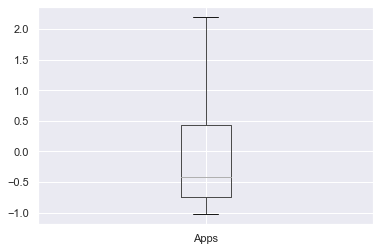

In [203]:
data_scaled.boxplot(['Apps'])
plt.show()

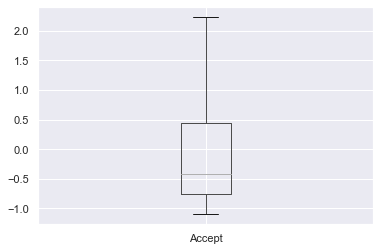

In [204]:
data_scaled.boxplot(['Accept'])
plt.show()

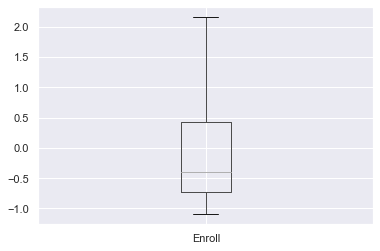

In [205]:
data_scaled.boxplot(['Enroll'])
plt.show()

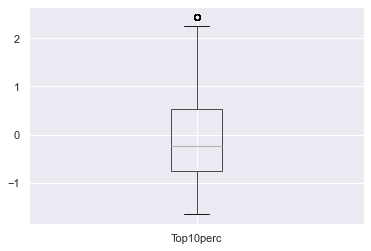

In [206]:
data_scaled.boxplot(['Top10perc'])
plt.show()

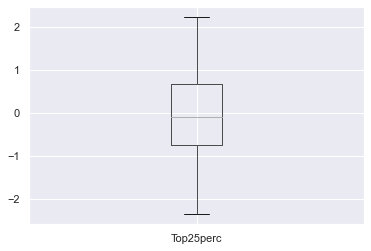

In [207]:
data_scaled.boxplot(['Top25perc'])
plt.show()

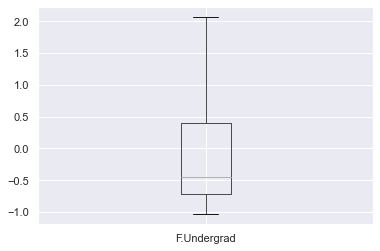

In [208]:
data_scaled.boxplot(['F.Undergrad'])
plt.show()

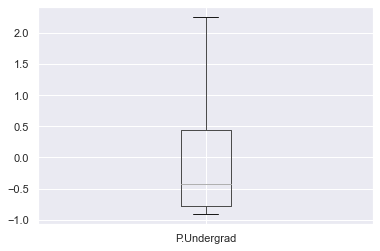

In [209]:
data_scaled.boxplot(['P.Undergrad'])
plt.show()

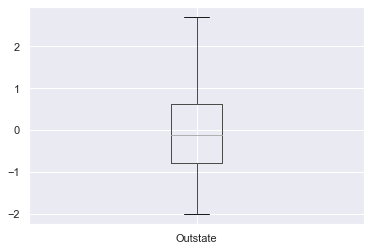

In [210]:
data_scaled.boxplot(['Outstate'])
plt.show()

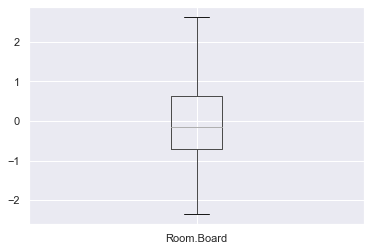

In [211]:
data_scaled.boxplot(['Room.Board'])
plt.show()

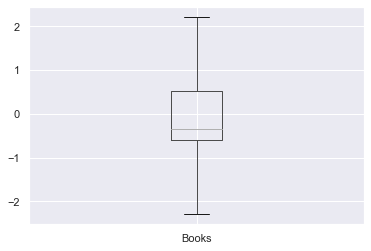

In [213]:
data_scaled.boxplot(['Books'])
plt.show()

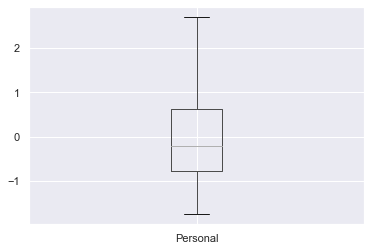

In [214]:
data_scaled.boxplot(['Personal'])
plt.show()

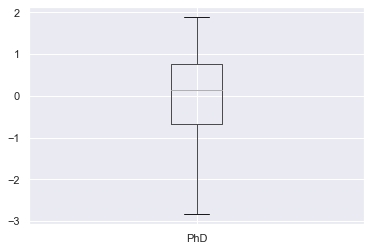

In [215]:
data_scaled.boxplot(['PhD'])
plt.show()

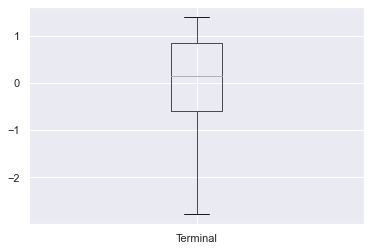

In [216]:
data_scaled.boxplot(['Terminal'])
plt.show()

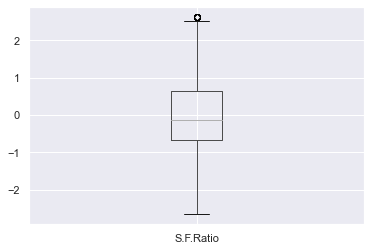

In [217]:
data_scaled.boxplot(['S.F.Ratio'])
plt.show()

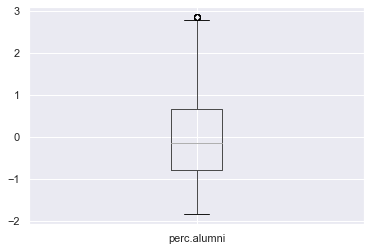

In [218]:
data_scaled.boxplot(['perc.alumni'])
plt.show()

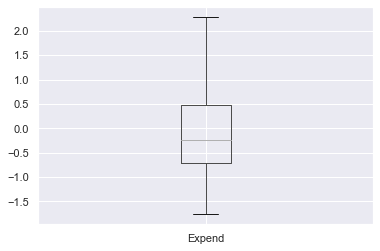

In [219]:
data_scaled.boxplot(['Expend'])
plt.show()

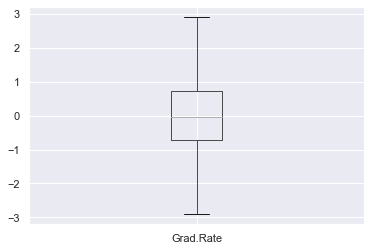

In [220]:
data_scaled.boxplot(['Grad.Rate'])
plt.show()

outliers are seen in two features hence we remove those from the scaled features.

In [221]:
def remove_outliers(col):
    sorted(col)
    Q1,Q3 = col.quantile([0.25,0.75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5*IQR)
    upper_range = Q3+(1.5*IQR)
    return lower_range, upper_range

In [222]:
out = ['Top10perc','perc.alumni']

In [223]:
for i in out:
    print(i)
    

Top10perc
perc.alumni


In [224]:
remove_outliers(data_scaled['Top10perc'])  

(-2.6869778995134874, 2.4502805353339037)

In [225]:

remove_outliers(data_scaled['perc.alumni'])

(-2.981276195564276, 2.864043801794847)

In [17]:
data_df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [18]:
data_scaled.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02
mean,6.355797e-17,6.774575e-17,-5.249269e-17,-2.753232e-17,-1.546739e-16,-1.661405e-16,-3.029180e-17,6.515595e-17,3.570717e-16,-2.192583e-16,4.765243e-17,5.954768e-17,-4.481615e-16,-2.057556e-17,-6.022638e-17,1.213101e-16,3.886495e-16
std,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00
min,-7.551337e-01,-7.947645e-01,-8.022728e-01,-1.506526e+00,-2.364419e+00,-7.346169e-01,-5.615022e-01,-2.014878e+00,-2.351778e+00,-2.747779e+00,-1.611860e+00,-3.962596e+00,-3.785982e+00,-2.929799e+00,-1.836580e+00,-1.240641e+00,-3.230876e+00
25%,-5.754408e-01,-5.775805e-01,-5.793514e-01,-7.123803e-01,-7.476067e-01,-5.586426e-01,-4.997191e-01,-7.762035e-01,-6.939170e-01,-4.810994e-01,-7.251203e-01,-6.532948e-01,-5.915023e-01,-6.546598e-01,-7.868237e-01,-5.574826e-01,-7.260193e-01
50%,-3.732540e-01,-3.710108e-01,-3.725836e-01,-2.585828e-01,-9.077663e-02,-4.111378e-01,-3.301442e-01,-1.120949e-01,-1.437297e-01,-2.992802e-01,-2.078552e-01,1.433889e-01,1.561419e-01,-1.237939e-01,-1.408197e-01,-2.458933e-01,-2.698956e-02
75%,1.609122e-01,1.654173e-01,1.314128e-01,4.221134e-01,6.671042e-01,6.294077e-02,7.341765e-02,6.179271e-01,6.318245e-01,3.067838e-01,5.310950e-01,7.562224e-01,8.358184e-01,6.093067e-01,6.666852e-01,2.241735e-01,7.302926e-01
max,1.165867e+01,9.924816e+00,6.043678e+00,3.882319e+00,2.233391e+00,5.764674e+00,1.378992e+01,2.800531e+00,3.436593e+00,1.085230e+01,8.068387e+00,1.859323e+00,1.379560e+00,6.499390e+00,3.331452e+00,8.924721e+00,3.060392e+00


In [19]:
np.round(data_df.cov(),2)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,14978459.53,8949859.81,3045255.99,23132.77,26952.66,15289702.47,2346620.15,780970.36,700072.87,84703.75,468346.83,24689.43,21053.07,1465.06,-4327.12,5246171.10,9756.42
Accept,8949859.81,6007959.70,2076267.76,8321.12,12013.40,10393582.44,1646669.72,-253962.29,244347.15,45942.81,333556.63,14238.20,12182.09,1709.84,-4859.49,1596271.69,2834.16
Enroll,3045255.99,2076267.76,863368.39,2971.58,4172.59,4347529.88,725790.67,-581188.48,-40997.06,17291.20,176737.97,5028.96,4217.09,872.68,-2081.69,311345.43,-356.59
Top10perc,23132.77,8321.12,2971.58,311.18,311.63,12089.11,-2829.47,39907.18,7186.71,346.18,-1114.55,153.18,127.55,-26.87,99.57,60879.31,149.99
Top25perc,26952.66,12013.40,4172.59,311.63,392.23,19158.95,-1615.41,38992.43,7199.90,377.76,-1083.61,176.52,153.00,-23.10,102.55,54546.48,162.37
F.Undergrad,15289702.47,10393582.44,4347529.88,12089.11,19158.95,23526579.33,4212910.09,-4209843.04,-366458.22,92535.76,1041709.09,25211.78,21424.24,5370.21,-13791.93,472403.96,-6563.31
P.Undergrad,2346620.15,1646669.72,725790.67,-2829.47,-1615.41,4212910.09,2317798.85,-1552704.28,-102391.86,20410.45,329732.43,3706.76,3180.60,1401.30,-5297.34,-664351.15,-6721.06
Outstate,780970.36,-253962.29,-581188.48,39907.18,38992.43,-4209843.04,-1552704.28,16184661.63,2886597.39,25808.24,-814673.72,25157.52,24164.15,-8835.25,28229.55,14133235.71,39479.68
Room.Board,700072.87,244347.15,-40997.06,7186.71,7199.90,-366458.22,-102391.86,2886597.39,1202743.03,23170.31,-148083.77,5895.03,6047.30,-1574.21,3701.43,2873308.48,8005.36
Books,84703.75,45942.81,17291.20,346.18,377.76,92535.76,20410.45,25808.24,23170.31,27259.78,20043.03,72.53,242.96,-20.87,-82.26,96912.58,3.01


Comment on the comparison between the covariance and the correlation matrices from this data [on scaled data].

In [20]:
np.round(data_scaled.cov(),2)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.00,0.94,0.85,0.34,0.35,0.82,0.40,0.05,0.17,0.13,0.18,0.39,0.37,0.10,-0.09,0.26,0.15
Accept,0.94,1.00,0.91,0.19,0.25,0.88,0.44,-0.03,0.09,0.11,0.20,0.36,0.34,0.18,-0.16,0.12,0.07
Enroll,0.85,0.91,1.00,0.18,0.23,0.97,0.51,-0.16,-0.04,0.11,0.28,0.33,0.31,0.24,-0.18,0.06,-0.02
Top10perc,0.34,0.19,0.18,1.00,0.89,0.14,-0.11,0.56,0.37,0.12,-0.09,0.53,0.49,-0.39,0.46,0.66,0.50
Top25perc,0.35,0.25,0.23,0.89,1.00,0.20,-0.05,0.49,0.33,0.12,-0.08,0.55,0.53,-0.30,0.42,0.53,0.48
F.Undergrad,0.82,0.88,0.97,0.14,0.20,1.00,0.57,-0.22,-0.07,0.12,0.32,0.32,0.30,0.28,-0.23,0.02,-0.08
P.Undergrad,0.40,0.44,0.51,-0.11,-0.05,0.57,1.00,-0.25,-0.06,0.08,0.32,0.15,0.14,0.23,-0.28,-0.08,-0.26
Outstate,0.05,-0.03,-0.16,0.56,0.49,-0.22,-0.25,1.00,0.66,0.04,-0.30,0.38,0.41,-0.56,0.57,0.67,0.57
Room.Board,0.17,0.09,-0.04,0.37,0.33,-0.07,-0.06,0.66,1.00,0.13,-0.20,0.33,0.38,-0.36,0.27,0.50,0.43
Books,0.13,0.11,0.11,0.12,0.12,0.12,0.08,0.04,0.13,1.00,0.18,0.03,0.10,-0.03,-0.04,0.11,0.00


Note that all variances are now 1 (main diagonal). In fact, this matrix is same as the correlation matrix    of    the    original    (unscaled)    variables.    

here after scaling mean is tending to 0 and standard deviation is 1.(we try to centre the data)
also min and max is at a comparable range.

In [21]:
np.round(data_df.corr(),2)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.00,0.94,0.85,0.34,0.35,0.81,0.40,0.05,0.16,0.13,0.18,0.39,0.37,0.10,-0.09,0.26,0.15
Accept,0.94,1.00,0.91,0.19,0.25,0.87,0.44,-0.03,0.09,0.11,0.20,0.36,0.34,0.18,-0.16,0.12,0.07
Enroll,0.85,0.91,1.00,0.18,0.23,0.96,0.51,-0.16,-0.04,0.11,0.28,0.33,0.31,0.24,-0.18,0.06,-0.02
Top10perc,0.34,0.19,0.18,1.00,0.89,0.14,-0.11,0.56,0.37,0.12,-0.09,0.53,0.49,-0.38,0.46,0.66,0.49
Top25perc,0.35,0.25,0.23,0.89,1.00,0.20,-0.05,0.49,0.33,0.12,-0.08,0.55,0.52,-0.29,0.42,0.53,0.48
F.Undergrad,0.81,0.87,0.96,0.14,0.20,1.00,0.57,-0.22,-0.07,0.12,0.32,0.32,0.30,0.28,-0.23,0.02,-0.08
P.Undergrad,0.40,0.44,0.51,-0.11,-0.05,0.57,1.00,-0.25,-0.06,0.08,0.32,0.15,0.14,0.23,-0.28,-0.08,-0.26
Outstate,0.05,-0.03,-0.16,0.56,0.49,-0.22,-0.25,1.00,0.65,0.04,-0.30,0.38,0.41,-0.55,0.57,0.67,0.57
Room.Board,0.16,0.09,-0.04,0.37,0.33,-0.07,-0.06,0.65,1.00,0.13,-0.20,0.33,0.37,-0.36,0.27,0.50,0.42
Books,0.13,0.11,0.11,0.12,0.12,0.12,0.08,0.04,0.13,1.00,0.18,0.03,0.10,-0.03,-0.04,0.11,0.00


In [22]:
np.round(data_scaled.corr(),2)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.00,0.94,0.85,0.34,0.35,0.81,0.40,0.05,0.16,0.13,0.18,0.39,0.37,0.10,-0.09,0.26,0.15
Accept,0.94,1.00,0.91,0.19,0.25,0.87,0.44,-0.03,0.09,0.11,0.20,0.36,0.34,0.18,-0.16,0.12,0.07
Enroll,0.85,0.91,1.00,0.18,0.23,0.96,0.51,-0.16,-0.04,0.11,0.28,0.33,0.31,0.24,-0.18,0.06,-0.02
Top10perc,0.34,0.19,0.18,1.00,0.89,0.14,-0.11,0.56,0.37,0.12,-0.09,0.53,0.49,-0.38,0.46,0.66,0.49
Top25perc,0.35,0.25,0.23,0.89,1.00,0.20,-0.05,0.49,0.33,0.12,-0.08,0.55,0.52,-0.29,0.42,0.53,0.48
F.Undergrad,0.81,0.87,0.96,0.14,0.20,1.00,0.57,-0.22,-0.07,0.12,0.32,0.32,0.30,0.28,-0.23,0.02,-0.08
P.Undergrad,0.40,0.44,0.51,-0.11,-0.05,0.57,1.00,-0.25,-0.06,0.08,0.32,0.15,0.14,0.23,-0.28,-0.08,-0.26
Outstate,0.05,-0.03,-0.16,0.56,0.49,-0.22,-0.25,1.00,0.65,0.04,-0.30,0.38,0.41,-0.55,0.57,0.67,0.57
Room.Board,0.16,0.09,-0.04,0.37,0.33,-0.07,-0.06,0.65,1.00,0.13,-0.20,0.33,0.37,-0.36,0.27,0.50,0.42
Books,0.13,0.11,0.11,0.12,0.12,0.12,0.08,0.04,0.13,1.00,0.18,0.03,0.10,-0.03,-0.04,0.11,0.00


his matrix is same as the correlation matrix    of    the    original    (unscaled)    variables

We will work with the “data_scaled” data frame from now on. To investigate association between the variables visually, scatterplots of all possible pairs of the variables are considered

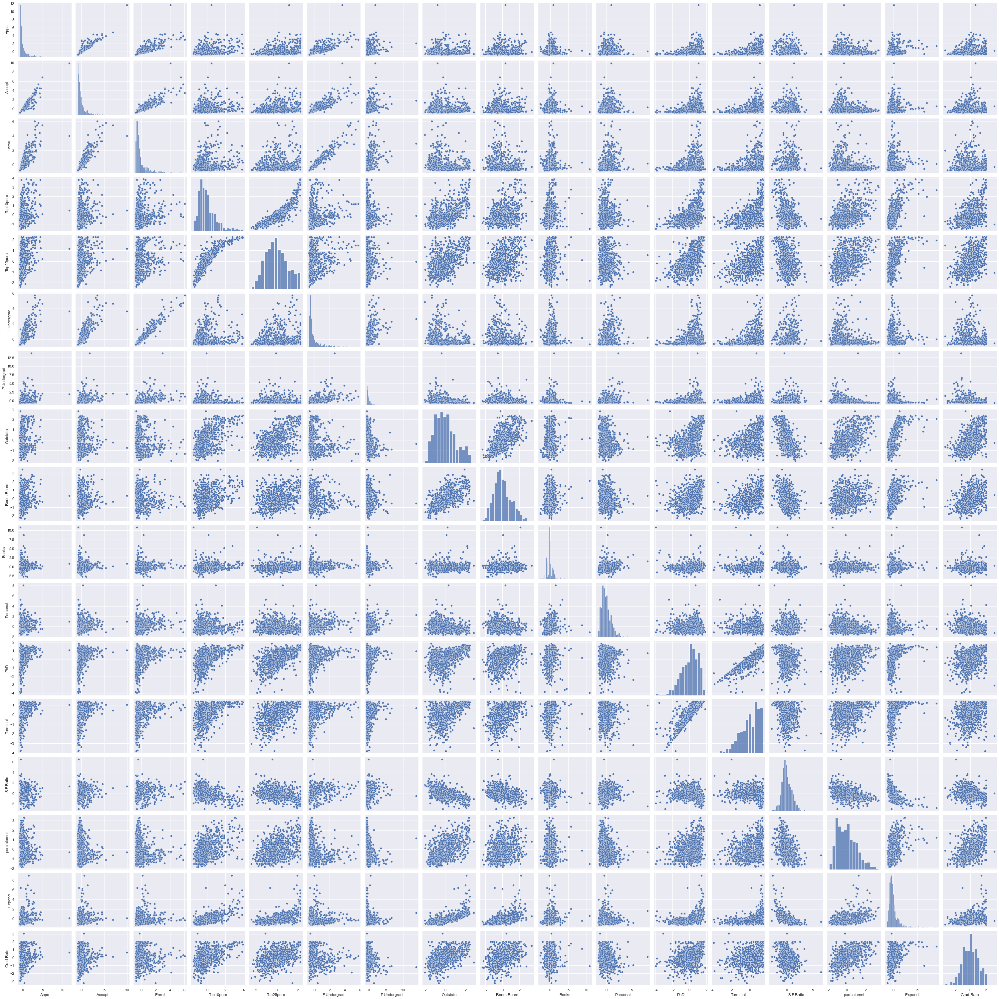

In [23]:
sns.set()
sns.pairplot(data_scaled)
plt.show()

Existence of such pairs of high and moderate correlations indicate that dimension reduction must be considered 

In [16]:
cov_matrix = np.cov(data_scaled.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00128866  0.94466636  0.84791332  0.33927032  0.35209304  0.81554018
   0.3987775   0.05022367  0.16515151  0.13272942  0.17896117  0.39120081
   0.36996762  0.09575627 -0.09034216  0.2599265   0.14694372]
 [ 0.94466636  1.00128866  0.91281145  0.19269493  0.24779465  0.87534985
   0.44183938 -0.02578774  0.09101577  0.11367165  0.20124767  0.35621633
   0.3380184   0.17645611 -0.16019604  0.12487773  0.06739929]
 [ 0.84791332  0.91281145  1.00128866  0.18152715  0.2270373   0.96588274
   0.51372977 -0.1556777  -0.04028353  0.11285614  0.28129148  0.33189629
   0.30867133  0.23757707 -0.18102711  0.06425192 -0.02236983]
 [ 0.33927032  0.19269493  0.18152715  1.00128866  0.89314445  0.1414708
  -0.10549205  0.5630552   0.37195909  0.1190116  -0.09343665  0.53251337
   0.49176793 -0.38537048  0.45607223  0.6617651   0.49562711]
 [ 0.35209304  0.24779465  0.2270373   0.89314445  1.00128866  0.19970167
  -0.05364569  0.49002449  0.33191707  0.115676   -0.08091441

Extract the eigenvalues and eigenvectors.[print both]

In [17]:
# Step 2- Get eigen values and eigen vector
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eig_vecs)
print('\n Eigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[-2.48765602e-01  3.31598227e-01  6.30921033e-02 -2.81310530e-01
   5.74140964e-03  1.62374420e-02  4.24863486e-02  1.03090398e-01
   9.02270802e-02 -5.25098025e-02  3.58970400e-01 -4.59139498e-01
   4.30462074e-02 -1.33405806e-01  8.06328039e-02 -5.95830975e-01
   2.40709086e-02]
 [-2.07601502e-01  3.72116750e-01  1.01249056e-01 -2.67817346e-01
   5.57860920e-02 -7.53468452e-03  1.29497196e-02  5.62709623e-02
   1.77864814e-01 -4.11400844e-02 -5.43427250e-01  5.18568789e-01
  -5.84055850e-02  1.45497511e-01  3.34674281e-02 -2.92642398e-01
  -1.45102446e-01]
 [-1.76303592e-01  4.03724252e-01  8.29855709e-02 -1.61826771e-01
  -5.56936353e-02  4.25579803e-02  2.76928937e-02 -5.86623552e-02
   1.28560713e-01 -3.44879147e-02  6.09651110e-01  4.04318439e-01
  -6.93988831e-02 -2.95896092e-02 -8.56967180e-02  4.44638207e-01
   1.11431545e-02]
 [-3.54273947e-01 -8.24118211e-02 -3.50555339e-02  5.15472524e-02
  -3.95434345e-01  5.26927980e-02  1.61332069e-01  1.22678028e-01
 

In [105]:
tot = sum(eig_vals)
var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 33.26608367  62.02142867  68.63859223  74.53673619  79.66062886
  84.15926753  87.59551019  90.79435736  93.28246491  95.52086136
  96.97201814  97.83716159  98.62640821  99.20703552  99.64582321
  99.86844192 100.        ]


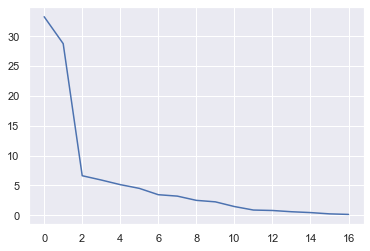

In [106]:
plt.plot(var_exp)

#Visually we can observe that their is a drop in variance explained with increase in number of PC's.
#We will proceed with 14 components here. But depending on requirement 90% variation or 5 components will also do good

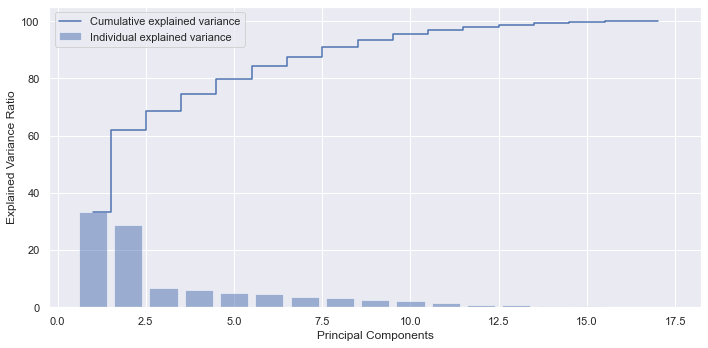

In [107]:
# Ploting 
plt.figure(figsize=(10 , 5))
plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

Perform PCA and export the data of the Principal Component (eigenvectors) into a data frame with the original features


Consider the cumulative values of the eigenvalues. How does it help you to decide on the optimum number of principal components? What do the eigenvectors indicate?

In [192]:
tot = sum(eig_vals) # calculate the total value of eigen values
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)] # looping to calculate variance explained %
cum_var_exp = np.cumsum(var_exp) # using numpy cumsum to create an array of cumsum of var_exp
cum_var_exp

array([ 33.26608367,  62.02142867,  68.63859223,  74.53673619,
        79.66062886,  84.15926753,  87.59551019,  90.79435736,
        93.28246491,  95.52086136,  96.97201814,  97.83716159,
        98.62640821,  99.20703552,  99.64582321,  99.86844192,
       100.        ])

In [ ]:
6 PCs are picking up 80% of the data and others can be dropped.

First two components explain 62% of variance in data

First three components explain 68% of variance in data

Write down the explicit form of the first PC (in terms of the eigenvectors. Use values with two places of decimals only). [hint: write the linear equation of PC in terms of eigenvectors and corresponding features]

In [194]:
data_df.columns

Index(['Names', 'Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc',
       'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books',
       'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend',
       'Grad.Rate', 'Names_cat'],
      dtype='object')

In [196]:
pca.components_[0]

array([ 0.26217154,  0.23056246,  0.1892764 ,  0.33887452,  0.33469053,
        0.16329301,  0.02247971,  0.28354729,  0.24418659,  0.09670828,
       -0.03522996,  0.3264107 ,  0.32311598, -0.16315164,  0.18661083,
        0.32895585,  0.23882245])

In [229]:
print('The Linear eq of 1st component: ')
for i in range(0,data_df.shape[0]):
    print('{} * {}'.format(np.round(pca.components_[0][i],2),data_df.columns[i]),end=' + ')

The Linear eq of 1st component: 
0.26 * Names + 0.23 * Apps + 0.19 * Accept + 0.34 * Enroll + 0.33 * Top10perc + 0.16 * Top25perc + 0.02 * F.Undergrad + 0.28 * P.Undergrad + 0.24 * Outstate + 0.1 * Room.Board + -0.04 * Books + 0.33 * Personal + 0.32 * PhD + -0.16 * Terminal + 0.19 * S.F.Ratio + 0.33 * perc.alumni + 0.24 * Expend + 

IndexError: index 17 is out of bounds for axis 0 with size 17

In [112]:
# Using scikit learn PCA here. It does all the above steps and maps data to PCA dimensions in one shot
from sklearn.decomposition import PCA



pca = PCA(n_components=14)
data_reduced = pca.fit_transform(data_scaled)
data_reduced.transpose()

array([[-1.60249937, -1.80467545, -1.60828257, ..., -0.57688267,
         6.570952  , -0.47739307],
       [ 0.99368301, -0.07041499, -1.38279212, ...,  0.01779846,
        -1.18493014,  1.04394672],
       [ 0.03004476,  2.12212752, -0.50151255, ...,  0.32216034,
         1.32596561, -1.42543835],
       ...,
       [ 0.19180598,  0.25723329, -0.21653416, ...,  0.172667  ,
        -0.05745397,  0.25604823],
       [ 0.19435855, -0.16407435,  0.17371276, ...,  0.01798502,
        -0.24818241, -0.26726005],
       [ 0.07491998,  0.18946447, -0.15194861, ...,  0.05385174,
         0.1882979 , -0.50966258]])

In [113]:
pca.components_

array([[ 2.62171542e-01,  2.30562461e-01,  1.89276397e-01,
         3.38874521e-01,  3.34690532e-01,  1.63293010e-01,
         2.24797091e-02,  2.83547285e-01,  2.44186588e-01,
         9.67082754e-02, -3.52299594e-02,  3.26410696e-01,
         3.23115980e-01, -1.63151642e-01,  1.86610828e-01,
         3.28955847e-01,  2.38822447e-01],
       [ 3.14136258e-01,  3.44623583e-01,  3.82813322e-01,
        -9.93191661e-02, -5.95055011e-02,  3.98636372e-01,
         3.57550046e-01, -2.51863617e-01, -1.31909124e-01,
         9.39739472e-02,  2.32439594e-01,  5.51390195e-02,
         4.30332048e-02,  2.59804556e-01, -2.57092552e-01,
        -1.60008951e-01, -1.67523664e-01],
       [-8.10177245e-02, -1.07658626e-01, -8.55296892e-02,
         7.88293849e-02,  5.07938247e-02, -7.37077827e-02,
        -4.03568700e-02, -1.49394795e-02,  2.11379165e-02,
         6.97121128e-01,  5.30972806e-01, -8.11134044e-02,
        -5.89785929e-02, -2.74150657e-01, -1.03715887e-01,
         1.84205687e-01, -2.4

In [115]:
df_comp = pd.DataFrame(pca.components_,columns=list(data_scaled))
df_comp.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,0.262172,0.230562,0.189276,0.338875,0.334691,0.163293,0.022480,0.283547,0.244187,0.096708,-0.035230,0.326411,0.323116,-0.163152,0.186611,0.328956,0.238822
1,0.314136,0.344624,0.382813,-0.099319,-0.059506,0.398636,0.357550,-0.251864,-0.131909,0.093974,0.232440,0.055139,0.043033,0.259805,-0.257093,-0.160009,-0.167524
2,-0.081018,-0.107659,-0.085530,0.078829,0.050794,-0.073708,-0.040357,-0.014939,0.021138,0.697121,0.530973,-0.081113,-0.058979,-0.274151,-0.103716,0.184206,-0.245336
3,0.098776,0.118140,0.009307,-0.369115,-0.416824,0.013950,0.225351,0.262975,0.580894,-0.036156,-0.114983,-0.147261,-0.089008,-0.259486,-0.223982,0.213756,-0.036192
4,0.219898,0.189635,0.162315,0.157211,0.144449,0.102728,-0.095679,0.037275,-0.069108,0.035406,-0.000475,-0.550787,-0.590407,-0.142843,0.128216,-0.022424,0.356843


<AxesSubplot:>

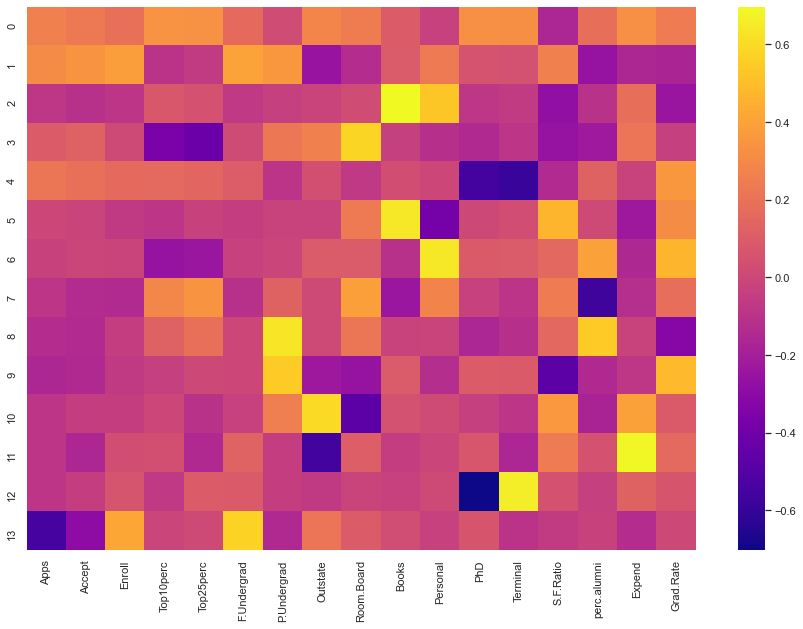

In [118]:
plt.figure(figsize=(15,10))
sns.heatmap(df_comp,cmap='plasma',)

In [1]:
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]

with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(7), var_exp, alpha=0.5, align='center',
            label='individual explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

NameError: name 'eig_vals' is not defined

observing the same with a plot for all attributes.

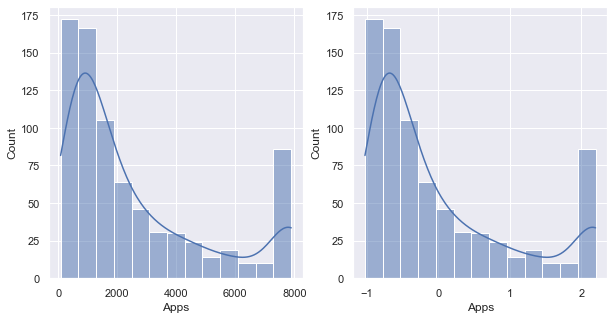

In [119]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Apps'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Apps'] , kde=True, ax=axes[1])
plt.show()

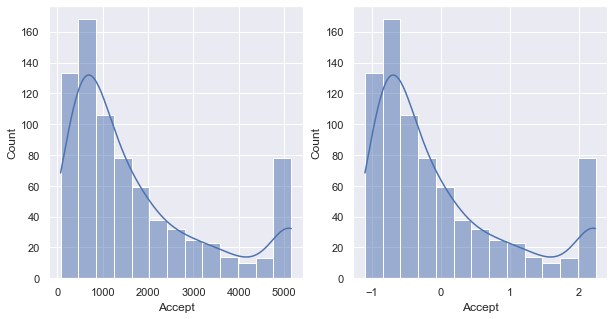

In [120]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Accept'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Accept'] , kde=True, ax=axes[1])
plt.show()

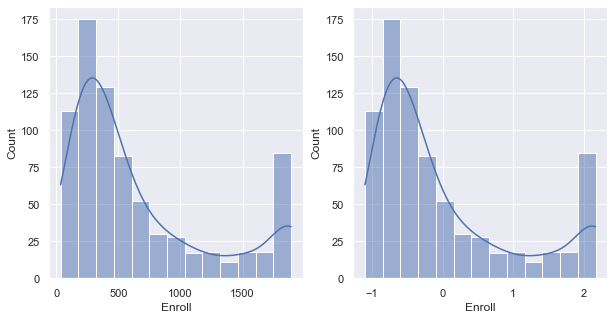

In [121]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Enroll'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Enroll'] , kde=True, ax=axes[1])
plt.show()

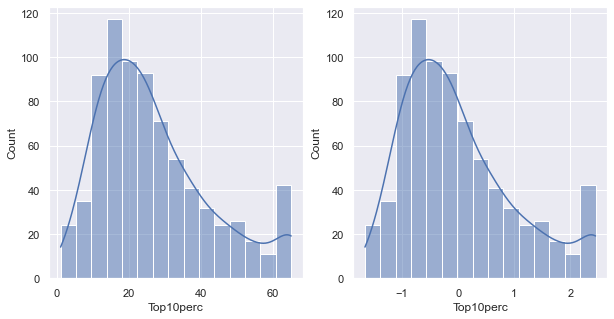

In [122]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Top10perc'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Top10perc'] , kde=True, ax=axes[1])
plt.show()

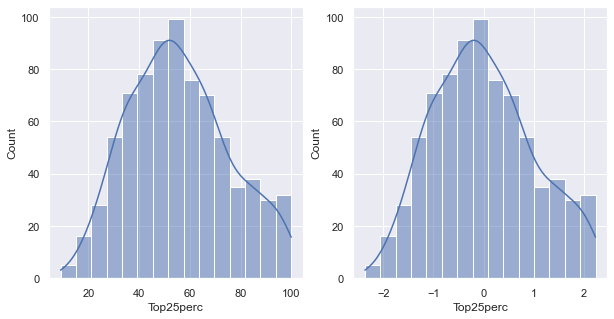

In [123]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Top25perc'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Top25perc'] , kde=True, ax=axes[1])
plt.show()

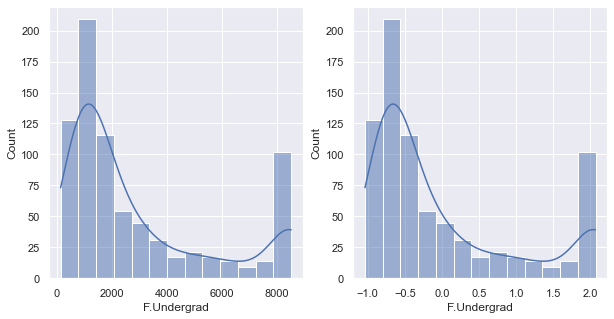

In [124]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['F.Undergrad'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['F.Undergrad'] , kde=True, ax=axes[1])
plt.show()

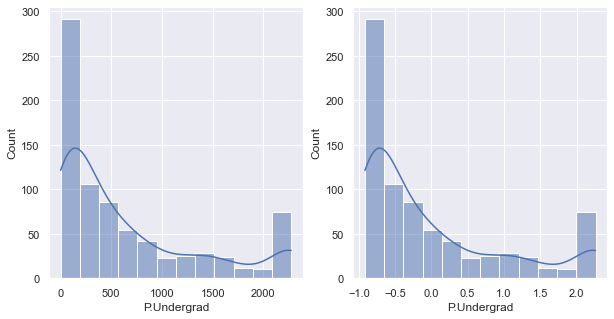

In [125]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['P.Undergrad'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['P.Undergrad'] , kde=True, ax=axes[1])
plt.show()

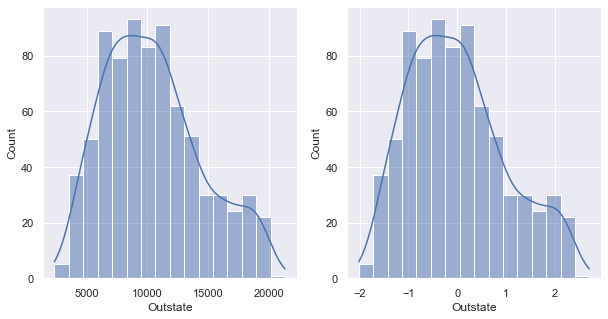

In [126]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Outstate'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Outstate'] , kde=True, ax=axes[1])
plt.show()

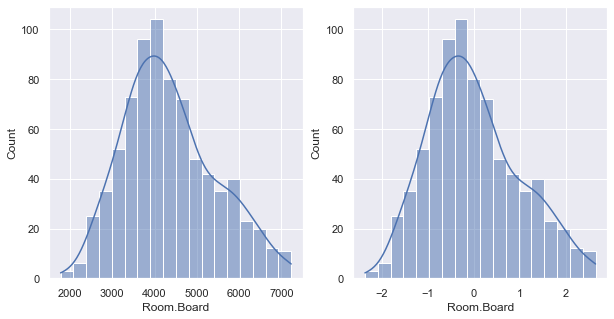

In [127]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Room.Board'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Room.Board'] , kde=True, ax=axes[1])
plt.show()

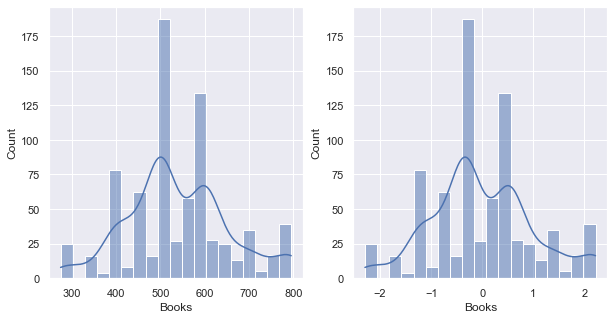

In [128]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Books'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Books'] , kde=True, ax=axes[1])
plt.show()

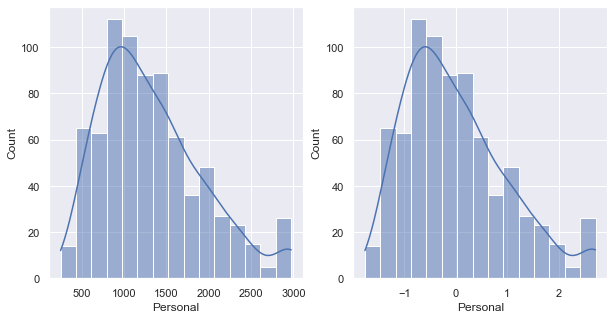

In [129]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Personal'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Personal'] , kde=True, ax=axes[1])
plt.show()

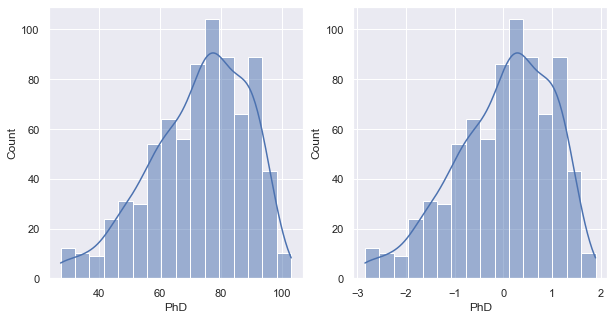

In [130]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['PhD'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['PhD'] , kde=True, ax=axes[1])
plt.show()

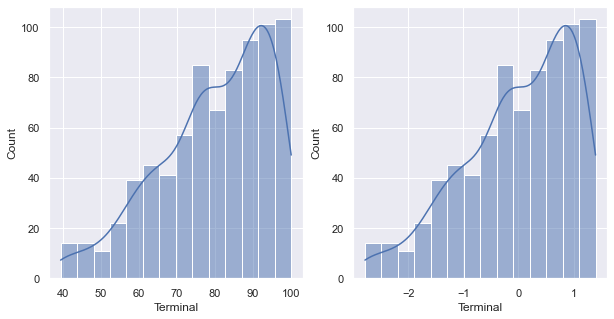

In [131]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Terminal'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Terminal'] , kde=True, ax=axes[1])
plt.show()

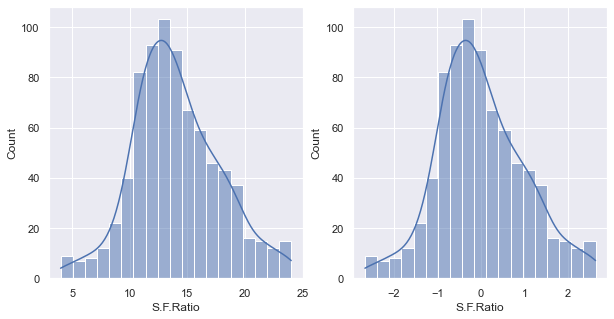

In [132]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['S.F.Ratio'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['S.F.Ratio'] , kde=True, ax=axes[1])
plt.show()

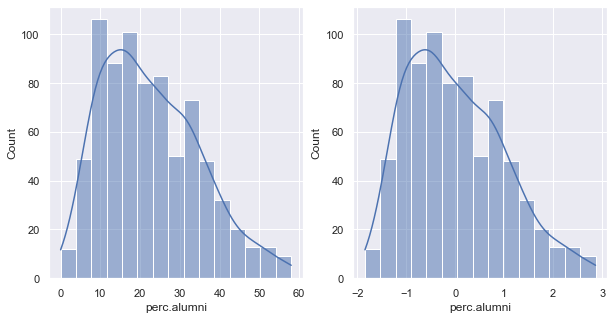

In [133]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['perc.alumni'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['perc.alumni'] , kde=True, ax=axes[1])
plt.show()

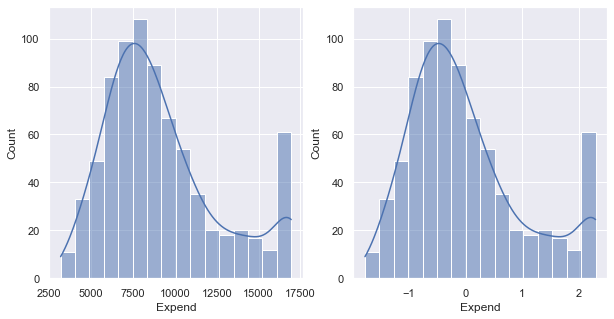

In [134]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Expend'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Expend'] , kde=True, ax=axes[1])
plt.show()

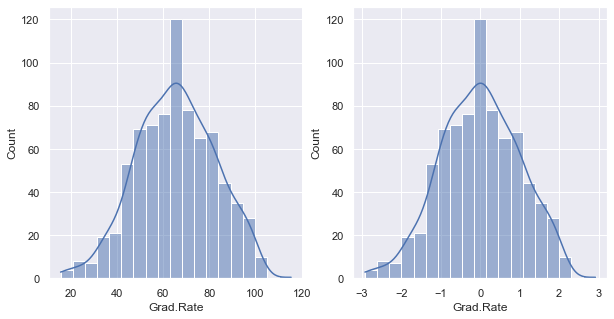

In [135]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(data_df['Grad.Rate'] , kde=True, ax=axes[0])
sns.histplot(data_scaled['Grad.Rate'] , kde=True, ax=axes[1])
plt.show()

MIN MAX SCALER METHOD

In [136]:
# Method III Min-Max method
from sklearn.preprocessing import MinMaxScaler
# build the scaler model
scaler = MinMaxScaler().fit(data_df[num])
# transform the test test
data_minmax = scaler.transform(data_df[num])
data_minmax=pd.DataFrame(data_minmax, columns=data_df[num].columns)
data_minmax.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,0.318663,0.329453,0.336774,0.403797,0.514249,0.333510,0.287988,0.426494,0.472601,0.508512,0.394051,0.599666,0.665826,0.502561,0.391759,0.435715,0.499685
std,0.309942,0.299742,0.307015,0.243477,0.217635,0.322012,0.314984,0.211753,0.200141,0.221596,0.223672,0.211300,0.239224,0.189211,0.212508,0.246794,0.171425
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.088932,0.104683,0.111470,0.218750,0.351648,0.101723,0.041337,0.262209,0.333425,0.375000,0.220183,0.456954,0.520661,0.375000,0.224138,0.259037,0.375000
50%,0.188996,0.204250,0.214863,0.343750,0.494505,0.186989,0.154793,0.402791,0.444077,0.432692,0.348624,0.629139,0.702479,0.480000,0.362069,0.377184,0.495000
75%,0.453359,0.462810,0.466882,0.531250,0.659341,0.461034,0.424802,0.557325,0.600055,0.625000,0.532110,0.761589,0.867769,0.625000,0.534483,0.555422,0.625000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Min-Max method ensure that the data scaled to have values in the range 0 to 1

TRANSFORMATION

1) attribute apps.

In [137]:
data_df.Apps.describe()

count     777.000000
mean     2571.352638
std      2422.195279
min        81.000000
25%       776.000000
50%      1558.000000
75%      3624.000000
max      7896.000000
Name: Apps, dtype: float64

<AxesSubplot:xlabel='Apps'>

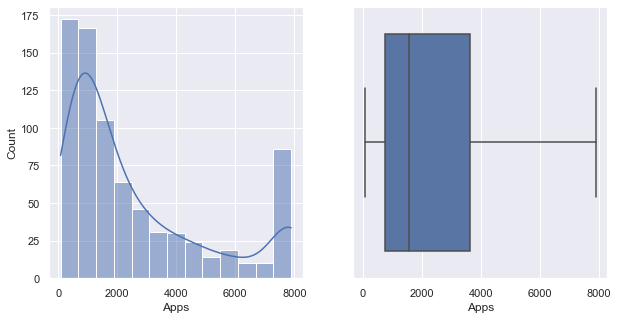

In [138]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df.Apps, kde=True, ax=axs[0]) 
sns.boxplot(x= 'Apps', data=data_df, ax=axs[1])

In [139]:
print("skewness of Apps is",data_df['Apps'].skew())
print("kurtosis of Apps is ",data_df['Apps'].kurtosis())

skewness of Apps is 1.1663338261291898
kurtosis of Apps is  0.05737264961742916


Skewness assesses the extent to which a variable’s distribution is symmetrical

Kurtosis is a measure of whether the distribution is too peaked

For an ideal normal distribution (theoretical) Skewness and Kurtosis have to be between -1 to +1 Or we can say that if we are able to reduce the skewness and kurtosis from a very high value to lower values we are able to get the data distirbuted more normally

-0.05902153487907594
-0.8059408271781976


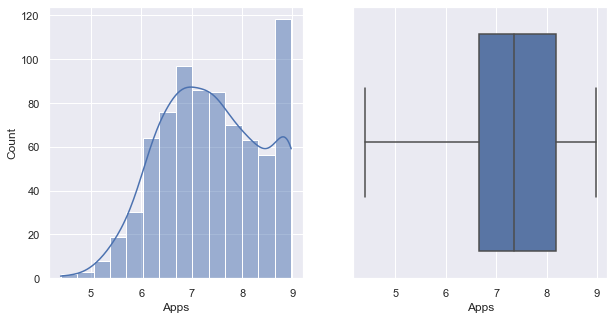

In [140]:
# Using log transformation
print(np.log(data_df['Apps']).skew())
print(np.log(data_df['Apps']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Apps']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Apps']), ax = axs[1])
plt.show()

0.6727829389096067
-0.7103758794244226


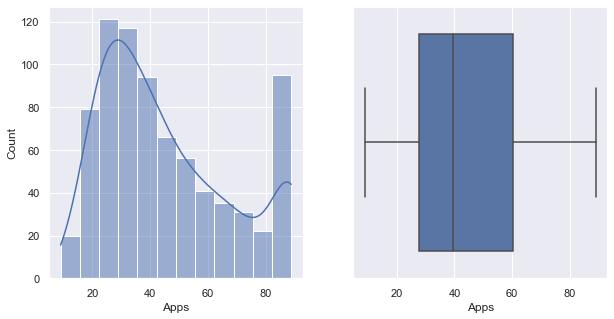

In [141]:
# Using sqrt for transformation
print(np.sqrt(data_df['Apps']).skew())
print(np.sqrt(data_df['Apps']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Apps']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Apps']), ax = axs[1])
plt.show()

go with sq root

0.112611860570649
-0.9094310004280008


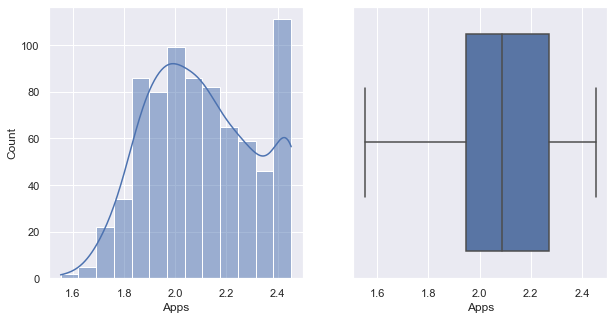

In [142]:
# Using root of 10 for transformation
print((data_df['Apps']**0.1).skew())
print((data_df['Apps']**0.1).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot((data_df['Apps']**0.1), kde=True, ax = axs[0])
sns.boxplot(x=(data_df['Apps']**0.1), ax = axs[1])
plt.show()

We see that the skewness and kurtosis are between the range -1 and +1 meaning that they are approximately normal.

In [144]:
2) ACCEPT


SyntaxError: unmatched ')' (<ipython-input-144-3119caa2da15>, line 1)

In [145]:
data_df['Accept'].describe()

count     777.000000
mean     1746.280566
std      1523.286632
min        72.000000
25%       604.000000
50%      1110.000000
75%      2424.000000
max      5154.000000
Name: Accept, dtype: float64

skewness is 1.151198770900157
kurtosis is  0.11881525732679687


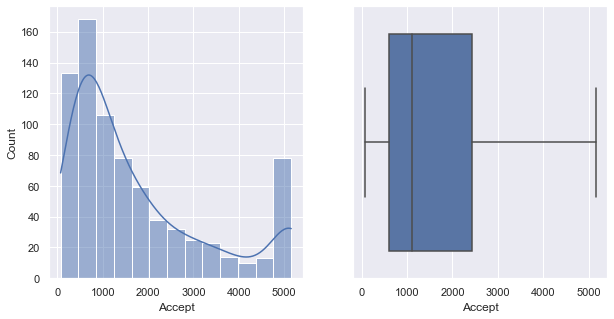

In [146]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Accept'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Accept', data=data_df, ax=axs[1])

print("skewness is",data_df['Accept'].skew())
print("kurtosis is ",data_df['Accept'].kurtosis())

-0.10977263199317674
-0.6904920716213141


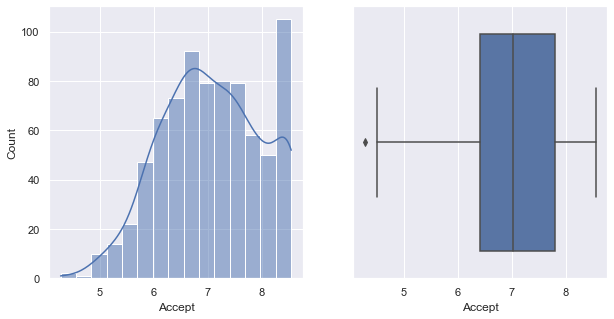

In [147]:
# Using log transformation
print(np.log(data_df['Accept']).skew())
print(np.log(data_df['Accept']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Accept']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Accept']), ax = axs[1])
plt.show()

In [ ]:
obtaning an outlier using log transformation hence discard. using sq root method to check again.

0.6335738710039986
-0.6625079320925655


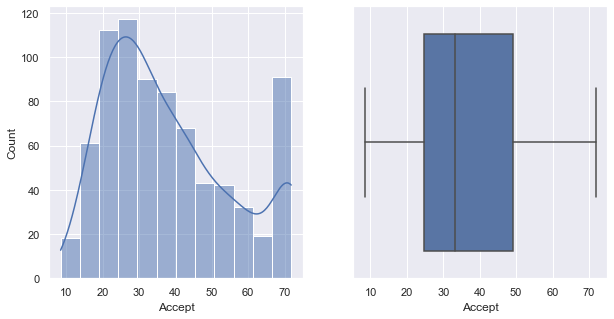

In [148]:
# Using sqrt for transformation
print(np.sqrt(data_df['Accept']).skew())
print(np.sqrt(data_df['Accept']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Accept']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Accept']), ax = axs[1])
plt.show()

go with sq trans

We see that the skewness and kurtosis are between the range -1 and +1 meaning that they are approximately normal.

In [ ]:
3) ENROLL
summary of attribute Enroll.

In [149]:
data_df.Enroll.describe()

count     777.000000
mean      660.388674
std       570.126836
min        35.000000
25%       242.000000
50%       434.000000
75%       902.000000
max      1892.000000
Name: Enroll, dtype: float64

skewness of Enroll is 1.1550175867447874
kurtosis of Enroll is  -0.010580030211235325


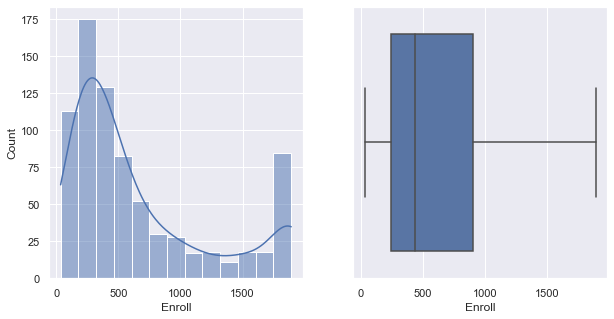

In [150]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df.Enroll, kde=True, ax=axs[0]) 
sns.boxplot(x= 'Enroll', data=data_df, ax=axs[1])

print("skewness of Enroll is",data_df['Enroll'].skew())
print("kurtosis of Enroll is ",data_df['Enroll'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['Enroll']).skew())
print(np.log(data_df['Enroll']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Enroll']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Enroll']), ax = axs[1])
plt.show()

0.7115693852177609
-0.6427966207845861


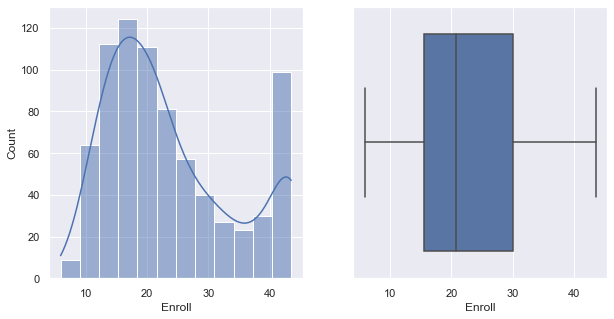

In [151]:
# Using sqrt for transformation
print(np.sqrt(data_df['Enroll']).skew())
print(np.sqrt(data_df['Enroll']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Enroll']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Enroll']), ax = axs[1])
plt.show()

In [ ]:
Go with square root its more or less normal

We see that the skewness and kurtosis are between the range -1 and +1 meaning that they are approximately normal.

4) TOP10PERC

In [152]:
data_df['Top10perc'].describe()

count    777.000000
mean      26.842986
std       15.582539
min        1.000000
25%       15.000000
50%       23.000000
75%       35.000000
max       65.000000
Name: Top10perc, dtype: float64

skewness is 0.880388871024029
kurtosis is  0.11666763057581742


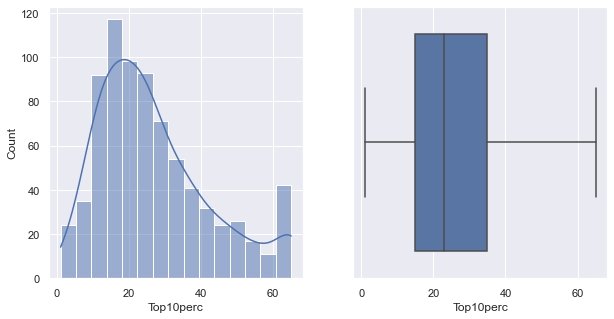

In [153]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Top10perc'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Top10perc', data=data_df, ax=axs[1])

print("skewness is",data_df['Top10perc'].skew())
print("kurtosis is ",data_df['Top10perc'].kurtosis())

In [ ]:
 # Using log transformation
print(np.log(data_df['Top10perc']).skew())
print(np.log(data_df['Top10perc']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Top10perc']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Top10perc']), ax = axs[1])
plt.show()

In [ ]:
use sqaure root now as log gives outliers

0.23641062809432273
-0.33912857193710844


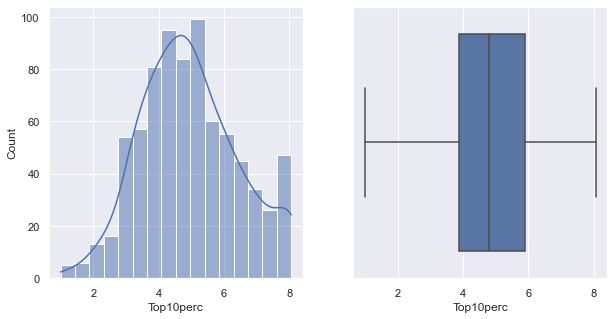

In [154]:
# Using sqrt for transformation
print(np.sqrt(data_df['Top10perc']).skew())
print(np.sqrt(data_df['Top10perc']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Top10perc']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Top10perc']), ax = axs[1])
plt.show()

In [ ]:
go with sq root

In [ ]:
5) Top25perc

In [155]:
data_df['Top25perc'].describe()

count    777.000000
mean      55.796654
std       19.804778
min        9.000000
25%       41.000000
50%       54.000000
75%       69.000000
max      100.000000
Name: Top25perc, dtype: float64

skewness is 0.25934035274548295
kurtosis is  -0.5641208067240719


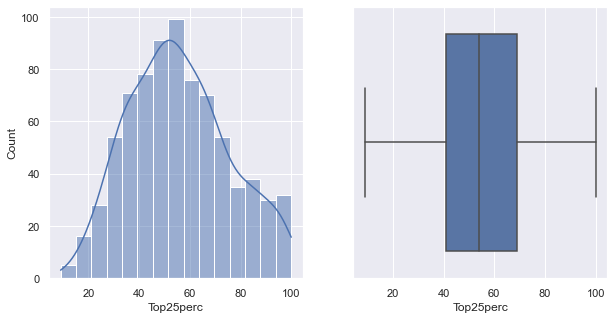

In [156]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Top25perc'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Top25perc', data=data_df, ax=axs[1])

print("skewness is",data_df['Top25perc'].skew())
print("kurtosis is ",data_df['Top25perc'].kurtosis())

In [ ]:
Top 25 requires no transformation its already more or less normal.

6) F.Undergrad

In [157]:
data_df['F.Undergrad'].describe()

count     777.000000
mean     2935.648005
std      2700.233049
min       139.000000
25%       992.000000
50%      1707.000000
75%      4005.000000
max      8524.500000
Name: F.Undergrad, dtype: float64

skewness is 1.149049343780702
kurtosis is  -0.14138976739568365


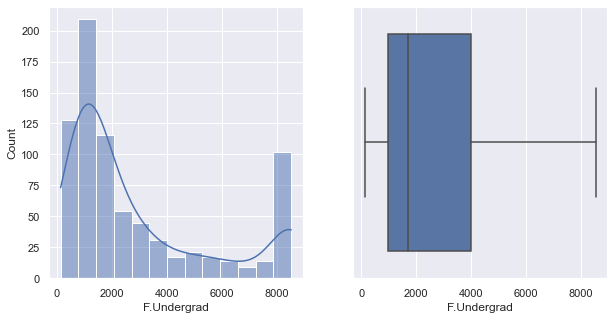

In [158]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['F.Undergrad'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'F.Undergrad', data=data_df, ax=axs[1])

print("skewness is",data_df['F.Undergrad'].skew())
print("kurtosis is ",data_df['F.Undergrad'].kurtosis())

In [ ]:
 # Using log transformation
print(np.log(data_df['F.Undergrad']).skew())
print(np.log(data_df['F.Undergrad']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['F.Undergrad']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['F.Undergrad']), ax = axs[1])
plt.show()

0.7634305298944599
-0.7112588161340931


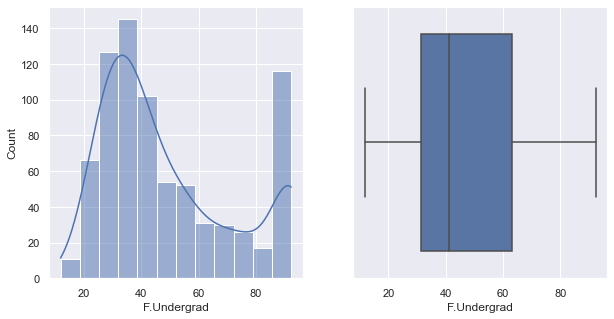

In [159]:
# Using sqrt for transformation
print(np.sqrt(data_df['F.Undergrad']).skew())
print(np.sqrt(data_df['F.Undergrad']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['F.Undergrad']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['F.Undergrad']), ax = axs[1])
plt.show()

In [ ]:
go with sq trans

7) P.Undergrad

In [160]:
data_df['P.Undergrad'].describe()

count     777.000000
mean      655.884170
std       716.274014
min         1.000000
25%        95.000000
50%       353.000000
75%       967.000000
max      2275.000000
Name: P.Undergrad, dtype: float64

skewness is 1.1662031630978382
kurtosis is  0.09370995222652301


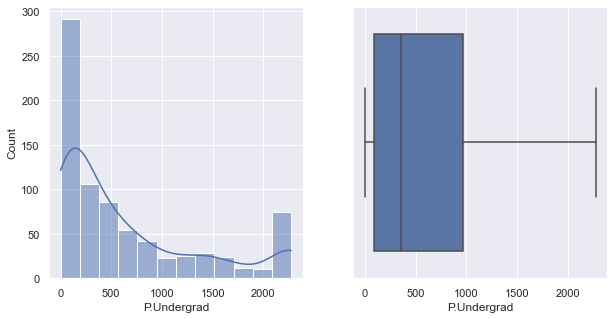

In [161]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['P.Undergrad'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'P.Undergrad', data=data_df, ax=axs[1])

print("skewness is",data_df['P.Undergrad'].skew())
print("kurtosis is ",data_df['P.Undergrad'].kurtosis())

-0.6856934575988362
0.16526456375272325


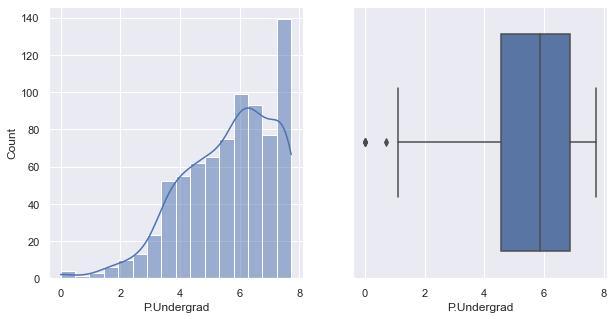

In [162]:
 # Using log transformation
print(np.log(data_df['P.Undergrad']).skew())
print(np.log(data_df['P.Undergrad']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['P.Undergrad']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['P.Undergrad']), ax = axs[1])
plt.show()

0.5350122210005143
-0.8781695244821117


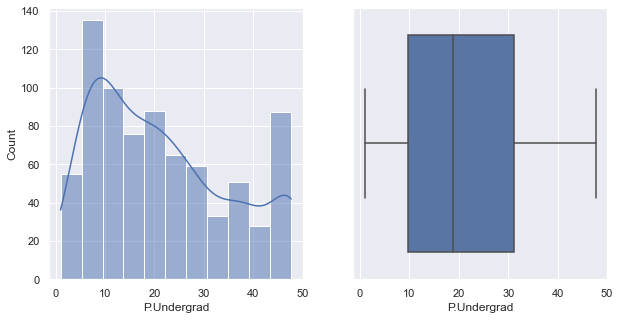

In [163]:
# Using sqrt for transformation
print(np.sqrt(data_df['P.Undergrad']).skew())
print(np.sqrt(data_df['P.Undergrad']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['P.Undergrad']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['P.Undergrad']), ax = axs[1])
plt.show()

In [ ]:
use sq root 

 8)Outstate

In [164]:
data_df['Outstate'].describe()

count      777.000000
mean     10440.196268
std       4021.712447
min       2340.000000
25%       7320.000000
50%       9990.000000
75%      12925.000000
max      21332.500000
Name: Outstate, dtype: float64

skewness is 0.5074408259478439
kurtosis is  -0.42013874977569365


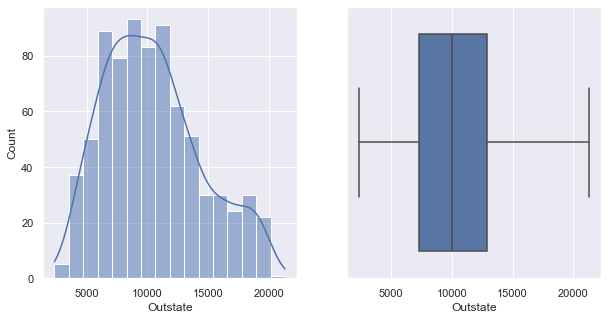

In [165]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Outstate'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Outstate', data=data_df, ax=axs[1])

print("skewness is",data_df['Outstate'].skew())
print("kurtosis is ",data_df['Outstate'].kurtosis())

-0.34581082441309785
-0.25063729219365616


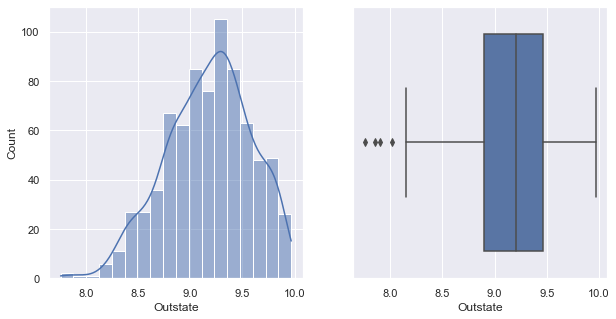

In [166]:
 # Using log transformation
print(np.log(data_df['Outstate']).skew())
print(np.log(data_df['Outstate']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Outstate']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Outstate']), ax = axs[1])
plt.show()

0.10995570633824893
-0.5859760983057116


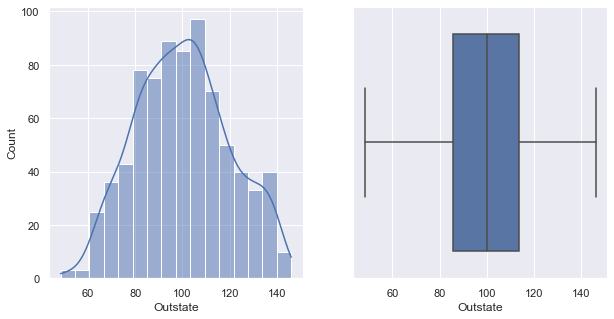

In [167]:
# Using sqrt for transformation
print(np.sqrt(data_df['Outstate']).skew())
print(np.sqrt(data_df['Outstate']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Outstate']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Outstate']), ax = axs[1])
plt.show()

In [ ]:
use sq root

In [ ]:
9) Room.Board

In [168]:
data_df['Room.Board'].describe()

count     777.000000
mean     4355.438224
std      1090.666009
min      1780.000000
25%      3597.000000
50%      4200.000000
75%      5050.000000
max      7229.500000
Name: Room.Board, dtype: float64

skewness is 0.44253000785023383
kurtosis is  -0.31209276055022706


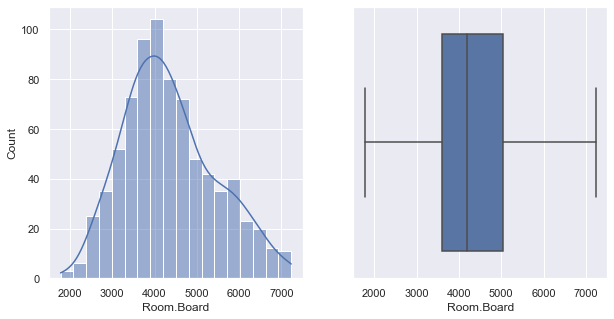

In [169]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Room.Board'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Room.Board', data=data_df, ax=axs[1])

print("skewness is",data_df['Room.Board'].skew())
print("kurtosis is ",data_df['Room.Board'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['Room.Board']).skew())
print(np.log(data_df['Room.Board']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Room.Board']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Room.Board']), ax = axs[1])
plt.show()

0.15558206735251878
-0.40322484511346435


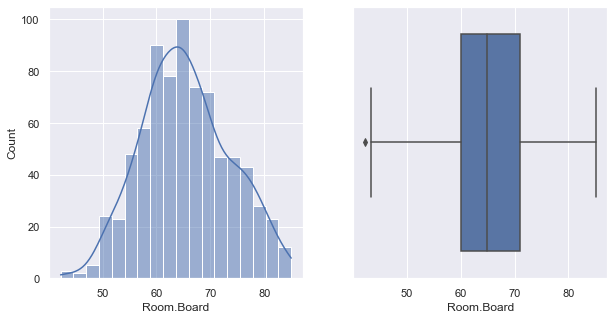

In [170]:
# Using sqrt for transformation
print(np.sqrt(data_df['Room.Board']).skew())
print(np.sqrt(data_df['Room.Board']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Room.Board']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Room.Board']), ax = axs[1])
plt.show()

In [ ]:
not doing any trans as it is already symmetric

In [ ]:
10) Books

In [171]:
data_df['Books'].describe()

count    777.000000
mean     539.425997
std      115.229712
min      275.000000
25%      470.000000
50%      500.000000
75%      600.000000
max      795.000000
Name: Books, dtype: float64

skewness is 0.23971638392656572
kurtosis is  -0.08218166561937634


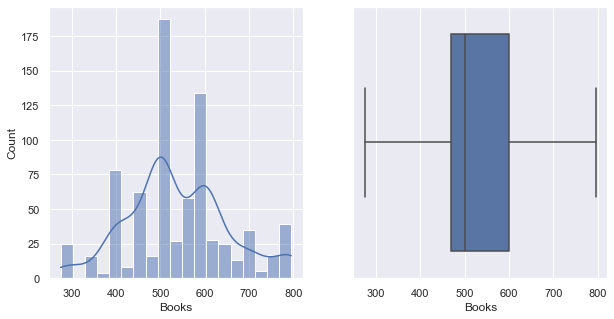

In [172]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Books'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Books', data=data_df, ax=axs[1])

print("skewness is",data_df['Books'].skew())
print("kurtosis is ",data_df['Books'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['Books']).skew())
print(np.log(data_df['Books']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Books']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Books']), ax = axs[1])
plt.show()

In [ ]:
# Using sqrt for transformation
print(np.sqrt(data_df['Books']).skew())
print(np.sqrt(data_df['Books']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Books']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Books']), ax = axs[1])
plt.show()

In [ ]:
no need for transformation.

In [ ]:
11) Personal

In [173]:
data_df['Personal'].describe()

count     777.000000
mean     1323.790219
std       609.505876
min       250.000000
25%       850.000000
50%      1200.000000
75%      1700.000000
max      2975.000000
Name: Personal, dtype: float64

skewness is 0.7920119167048857
kurtosis is  0.16739658605908092


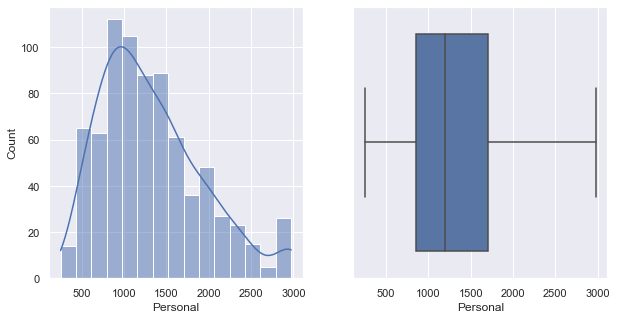

In [174]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Personal'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Personal', data=data_df, ax=axs[1])

print("skewness is",data_df['Personal'].skew())
print("kurtosis is ",data_df['Personal'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['Personal']).skew())
print(np.log(data_df['Personal']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Personal']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Personal']), ax = axs[1])
plt.show()

0.29688904151150286
-0.42504702663821314


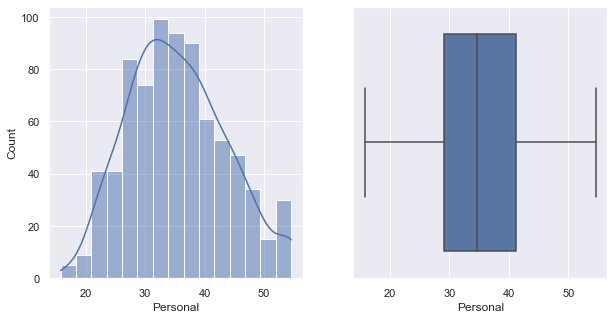

In [175]:
# Using sqrt for transformation
print(np.sqrt(data_df['Personal']).skew())
print(np.sqrt(data_df['Personal']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Personal']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Personal']), ax = axs[1])
plt.show()

In [ ]:
use sq

In [ ]:
12) PhD

In [176]:
data_df['PhD'].describe()

count    777.000000
mean      72.774775
std       15.953120
min       27.500000
25%       62.000000
50%       75.000000
75%       85.000000
max      103.000000
Name: PhD, dtype: float64

skewness is -0.6068219001029334
kurtosis is  -0.14577270838280132


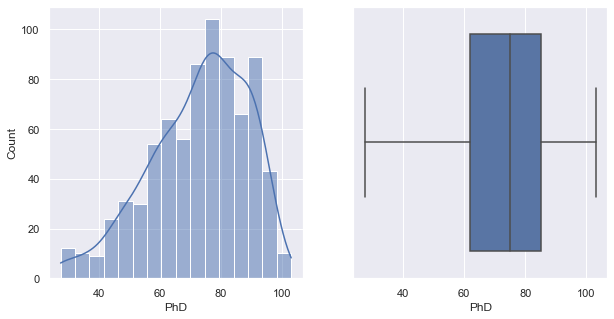

In [177]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['PhD'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'PhD', data=data_df, ax=axs[1])

print("skewness is",data_df['PhD'].skew())
print("kurtosis is ",data_df['PhD'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['PhD']).skew())
print(np.log(data_df['PhD']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['PhD']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['PhD']), ax = axs[1])
plt.show()

In [ ]:
# Using sqrt for transformation
print(np.sqrt(data_df['PhD']).skew())
print(np.sqrt(data_df['PhD']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['PhD']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['PhD']), ax = axs[1])
plt.show()

In [ ]:
no trans needed

In [ ]:
13) Terminal

In [178]:
data_df['Terminal'].describe()

count    777.000000
mean      79.782497
std       14.473057
min       39.500000
25%       71.000000
50%       82.000000
75%       92.000000
max      100.000000
Name: Terminal, dtype: float64

skewness is -0.7105780610611362
kurtosis is  -0.22107561544471643


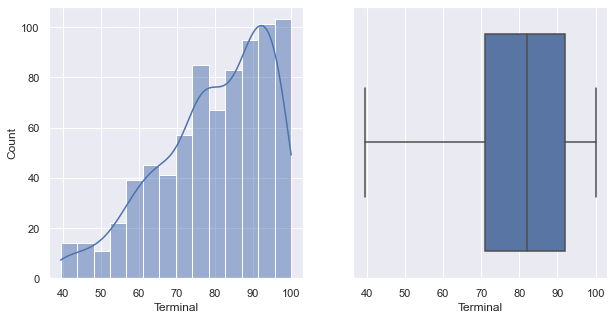

In [179]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Terminal'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Terminal', data=data_df, ax=axs[1])

print("skewness is",data_df['Terminal'].skew())
print("kurtosis is ",data_df['Terminal'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['Terminal']).skew())
print(np.log(data_df['Terminal']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['Terminal']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['Terminal']), ax = axs[1])
plt.show()

In [ ]:
# Using sqrt for transformation
print(np.sqrt(data_df['Terminal']).skew())
print(np.sqrt(data_df['Terminal']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['Terminal']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['Terminal']), ax = axs[1])
plt.show()

In [ ]:
no need for trans

In [ ]:
14)S.F.Ratio

In [180]:
data_df['S.F.Ratio'].describe()

count    777.000000
mean      14.051223
std        3.784212
min        4.000000
25%       11.500000
50%       13.600000
75%       16.500000
max       24.000000
Name: S.F.Ratio, dtype: float64

skewness is 0.26682795533443426
kurtosis is  0.12452073762853333


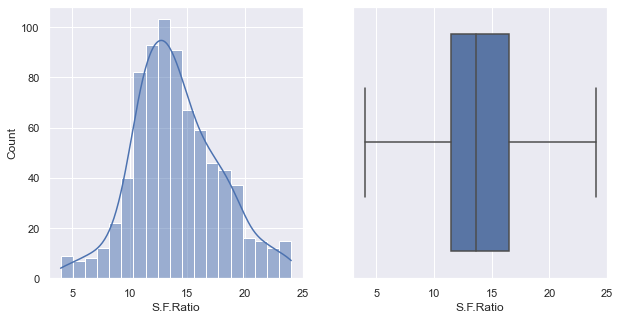

In [181]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['S.F.Ratio'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'S.F.Ratio', data=data_df, ax=axs[1])

print("skewness is",data_df['S.F.Ratio'].skew())
print("kurtosis is ",data_df['S.F.Ratio'].kurtosis())

In [ ]:
# Using log transformation
print(np.log(data_df['S.F.Ratio']).skew())
print(np.log(data_df['S.F.Ratio']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.log(data_df['S.F.Ratio']), kde=True, ax = axs[0])
sns.boxplot(x= np.log(data_df['S.F.Ratio']), ax = axs[1])
plt.show()

In [ ]:
# Using sqrt for transformation
print(np.sqrt(data_df['S.F.Ratio']).skew())
print(np.sqrt(data_df['S.F.Ratio']).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(np.sqrt(data_df['S.F.Ratio']), kde=True, ax = axs[0])
sns.boxplot(x=np.sqrt(data_df['S.F.Ratio']), ax = axs[1])
plt.show()

In [ ]:
no need for trans

In [ ]:
15) perc.alumni

In [182]:
data_df['perc.alumni'].describe()

count    777.000000
mean      22.722008
std       12.325480
min        0.000000
25%       13.000000
50%       21.000000
75%       31.000000
max       58.000000
Name: perc.alumni, dtype: float64

skewness is 0.572759802797918
kurtosis is  -0.23082024424773717


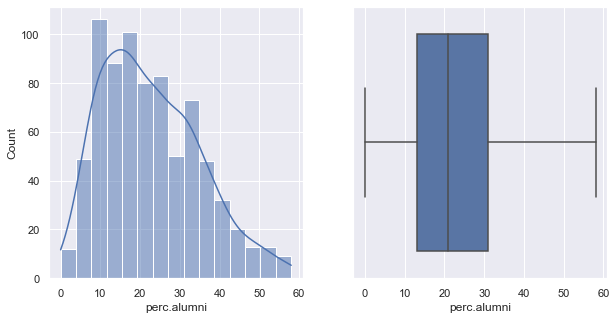

In [183]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['perc.alumni'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'perc.alumni', data=data_df, ax=axs[1])

print("skewness is",data_df['perc.alumni'].skew())
print("kurtosis is ",data_df['perc.alumni'].kurtosis())

no trans

In [ ]:
16) Expend

In [184]:
data_df['Expend'].describe()

count      777.000000
mean      9182.523810
std       3396.496148
min       3186.000000
25%       6751.000000
50%       8377.000000
75%      10830.000000
max      16948.500000
Name: Expend, dtype: float64

skewness is 0.8755349997880512
kurtosis is  0.023554234480307912


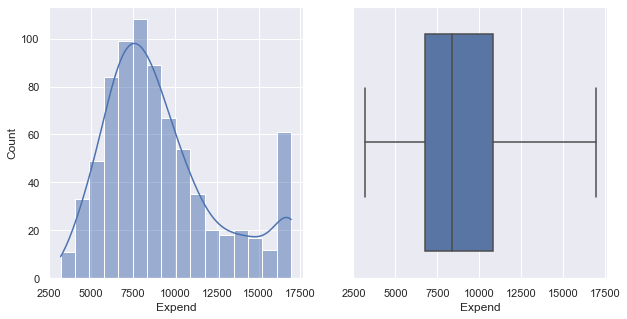

In [185]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Expend'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Expend', data=data_df, ax=axs[1])

print("skewness is",data_df['Expend'].skew())
print("kurtosis is ",data_df['Expend'].kurtosis())

In [ ]:
no trans

In [ ]:
17) Grad.Rate

In [186]:
data_df['Grad.Rate'].describe()

count    777.000000
mean      65.468468
std       17.142538
min       15.500000
25%       53.000000
50%       65.000000
75%       78.000000
max      115.500000
Name: Grad.Rate, dtype: float64

In [ ]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(data_df['Grad.Rate'], kde=True, ax=axs[0]) 
sns.boxplot(x= 'Grad.Rate', data=data_df, ax=axs[1])

print("skewness is",data_df['Grad.Rate'].skew())
print("kurtosis is ",data_df['Grad.Rate'].kurtosis())

In [ ]:
no trans

In [ ]:
ONE HOT ENCODING

In [187]:
data_df[cat]

,Names
0,Abilene Christian University
1,Adelphi University
2,Adrian College
3,Agnes Scott College
4,Alaska Pacific University
...,...
772,Worcester State College
773,Xavier University
774,Xavier University of Louisiana
775,Yale University


In [188]:
# convert a column to a category, then use those category values for your label encoding:
data_df["Names"] =data_df["Names"].astype('category')
data_df.dtypes

Names          category
Apps            float64
Accept          float64
Enroll          float64
Top10perc       float64
Top25perc         int64
F.Undergrad     float64
P.Undergrad     float64
Outstate        float64
Room.Board      float64
Books           float64
Personal        float64
PhD             float64
Terminal        float64
S.F.Ratio       float64
perc.alumni     float64
Expend          float64
Grad.Rate       float64
dtype: object

In [189]:
data_df["Names_cat"] = data_df["Names"].cat.codes
data_df["Names_cat"].head()

0    0
1    1
2    2
3    3
4    4
Name: Names_cat, dtype: int16

In [190]:
data_df["Names"].value_counts()

York College of Pennsylvania         1
Hamilton College                     1
Huron University                     1
Huntington College                   1
Huntingdon College                   1
                                    ..
Saint Mary-of-the-Woods College      1
Saint Mary's College of Minnesota    1
Saint Mary's College                 1
Saint Louis University               1
Abilene Christian University         1
Name: Names, Length: 777, dtype: int64

In [191]:
data_df["Names_cat"].value_counts()

776    1
242    1
264    1
263    1
262    1
      ..
514    1
513    1
512    1
511    1
0      1
Name: Names_cat, Length: 777, dtype: int64